In [1]:
import pandas as pd
import numpy as np
import scanpy as sc
import time
import anndata as ad
import matplotlib.pyplot as plt
import seaborn as sns
from scTools import input, preprocess, process, out
import gseapy

%load_ext autoreload
%autoreload 2

In [3]:
h5ad=False

### Load adata objects
treatments = ['NonfatVehicle', 'FriedVehicle', 'FriedCRV431', 'FriedLANI', 'FriedCRVLAN']
if h5ad:
    path="/Volumes/Expansion/Hepion/ClusteringResults/"
    Data = input.loadAllFriedman(path)
else:
    mtxPath = "/Volumes/Expansion/Hepion/Data/"
    Data = {t:input.loadSTAR(f"{mtxPath}{t}/", labels=False, make_unique=False) for t in treatments}
    for t in treatments:
        preprocess.filter(Data[t], min_cells=5, min_genes=200)
        Data[t] = preprocess.mitoFilter(Data[t], plot=False)
        Data[t] = preprocess.riboFilter(Data[t], plot=False)
        Data[t] = Data[t][:,Data[t].X.sum(axis=0)>=10]
        Data[t].raw=Data[t]
        preprocess.logNorm(Data[t])
        #Data[t].raw = Data[t]
        #sc.pp.scale(Data[t], max_value=10)
        print(Data[t])
        
        print(Data[t].obs)

### To draw
doDraw=False
if doDraw:
    adata = process.catAdata(Data, Data.keys())
    preprocess.umapify(adata, color=['batch','fineClusters'], redoPCA=True)
    Data = { k:adata[adata.obs['batch']==k] for k in Data.keys() }
    preprocess.umapify(process.catAdata(Data, Data.keys(), obsKey='coarseClusters', obsVal='T Cells'), color=['batch','fineClusters'], redoPCA=False)
print(Data.keys())

/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:140: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_genes'] = number
/Volumes/Expansion/Hepion/scTools/scTools/preprocess/__init__.py:48: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['ribo'] = adata.var_names.str.startswith(("Rps","Rpl"))


AnnData object with n_obs × n_vars = 5541 × 12407
    obs: 'coarseClusters', 'fineClusters', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'ribo'
    uns: 'log1p'
                 coarseClusters fineClusters  n_genes  n_genes_by_counts  \
AAACCCAAGCGAGTCA        B Cells      B Cells      621                620   
AAACCCACAAACCATC          Blood        Blood     2020               2019   
AAACCCATCCGTAGGC        B Cells      B Cells      525                525   
AAACGAAAGTTGAATG        B Cells      B Cells      502                501   
AAACGAAGTAGCGTTT        T Cells   Naive CD4+      981                979   
...                         ...          ...      ...                ...   
TTTGTTGAGATCACCT        B Cells      B Cells     1072               1072   
TTTGTTGAGATTGACA        B Cells      

/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:140: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_genes'] = number
/Volumes/Expansion/Hepion/scTools/scTools/preprocess/__init__.py:48: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['ribo'] = adata.var_names.str.startswith(("Rps","Rpl"))


AnnData object with n_obs × n_vars = 4886 × 14569
    obs: 'coarseClusters', 'fineClusters', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'ribo'
    uns: 'log1p'
                 coarseClusters    fineClusters  n_genes  n_genes_by_counts  \
AAACCCAAGCCAGACA           pDCs            pDCs     1831               1830   
AAACCCAAGTTGGGAC        B Cells         B Cells      982                982   
AAACCCACAAGAATGT      Monocytes            LAMs     2463               2460   
AAACCCAGTCTGATCA      Monocytes     Trans. Mono     2065               2064   
AAACCCATCGAAGAAT      Monocytes       Monocytes     1884               1883   
...                         ...             ...      ...                ...   
TTTGGTTCATCTCGTC      Monocytes       Monocytes     2227               2225   
TTTGGTTGTCGTC

/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:140: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_genes'] = number
/Volumes/Expansion/Hepion/scTools/scTools/preprocess/__init__.py:48: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['ribo'] = adata.var_names.str.startswith(("Rps","Rpl"))


AnnData object with n_obs × n_vars = 3327 × 14134
    obs: 'coarseClusters', 'fineClusters', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'ribo'
    uns: 'log1p'
                 coarseClusters     fineClusters  n_genes  n_genes_by_counts  \
AAACCCAGTTAAGACA        B Cells          B Cells     2079               2073   
AAACGAAAGGAGATAG      Monocytes   CV & Cap. Macs     1831               1830   
AAACGAACAGCACGAA      Monocytes             LAMs     2085               2082   
AAACGAAGTCCTGGGT        T Cells             CTLs     1419               1419   
AAACGCTAGATCCCAT        T Cells  Y-Delta T Cells     1694               1690   
...                         ...              ...      ...                ...   
TTTGGTTTCCTTGGAA      Monocytes   CV & Cap. Macs     1589               1587   
TTTGG

/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:140: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_genes'] = number
/Volumes/Expansion/Hepion/scTools/scTools/preprocess/__init__.py:48: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['ribo'] = adata.var_names.str.startswith(("Rps","Rpl"))


AnnData object with n_obs × n_vars = 5227 × 14796
    obs: 'coarseClusters', 'fineClusters', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'ribo'
    uns: 'log1p'
                  coarseClusters     fineClusters  n_genes  n_genes_by_counts  \
AAACCCAAGGGATGTC         T Cells  Y-Delta T Cells     1201               1199   
AAACCCACAGTATACC       Monocytes   CV & Cap. Macs     1104               1104   
AAACCCAGTAAGTCAA        NK Cells         NK Cells      991                990   
AAACCCAGTTTGTGGT           cDC1s            cDC1s     1234               1233   
AAACCCATCGCTGATA        NK Cells         NK Cells      777                776   
...                          ...              ...      ...                ...   
TTTGTTGAGACTTCGT       Monocytes   CV & Cap. Macs     1235               1233 

/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:140: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_genes'] = number
/Volumes/Expansion/Hepion/scTools/scTools/preprocess/__init__.py:48: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['ribo'] = adata.var_names.str.startswith(("Rps","Rpl"))


AnnData object with n_obs × n_vars = 5875 × 15468
    obs: 'coarseClusters', 'fineClusters', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'ribo'
    uns: 'log1p'
                     coarseClusters       fineClusters  n_genes  \
AAACCCAAGAGGTATT  Endothelial Cells  Endothelial Cells     2482   
AAACCCAAGCGTGCTC  Endothelial Cells  Endothelial Cells     1278   
AAACCCAAGGCACCAA  Endothelial Cells  Endothelial Cells     2343   
AAACCCAAGGCATCGA               pDCs               pDCs     1920   
AAACCCATCAGCTCTC               pDCs               pDCs     2485   
...                             ...                ...      ...   
TTTGGTTTCCATGATG          Monocytes          Pat. Mono     2237   
TTTGGTTTCGGTAGAG            T Cells               Th1s     1044   
TTTGTTGGTACAATAG            T Cells       

In [47]:
count=0
for v in Data['FriedCRV431'].var_names.str.startswith('mt-'):
    if v==True:
        count+=1
print(count)
print(Data['FriedVehicle'].obs.sort_values('pct_counts_mt'))

2
                  coarseClusters    fineClusters  n_genes  n_genes_by_counts  \
AACACACTCGCCGAAC       Monocytes  CV & Cap. Macs      727                724   
GACCCAGGTCGACGCT     Neutrophils     Neutrophils     1082               1081   
GACTGATTCATCTACT     Neutrophils     Neutrophils      732                731   
GAGTGTTTCTTGGTGA     Neutrophils     Neutrophils      818                818   
GCAGCCAAGGTAGCCA     Neutrophils     Neutrophils     1238               1232   
GCCAGGTGTTCGGACC     Neutrophils     Neutrophils      893                889   
GGGAGATCAGATTTCG     Neutrophils     Neutrophils     1368               1366   
GGGATGATCATACAGC     Neutrophils     Neutrophils      862                860   
GGTGTCGCAGGTTCCG     Neutrophils     Neutrophils      599                596   
GTAGGTTAGCGATGAC     Neutrophils     Neutrophils      743                742   
GTGCACGGTAGGCAGT     Neutrophils     Neutrophils     1371               1366   
GTGTAACGTAAGCTCT     Neutrophils     N

None
AnnData object with n_obs × n_vars = 6194 × 15582
    obs: 'coarseClusters', 'fineClusters', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'batch'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'log1p'


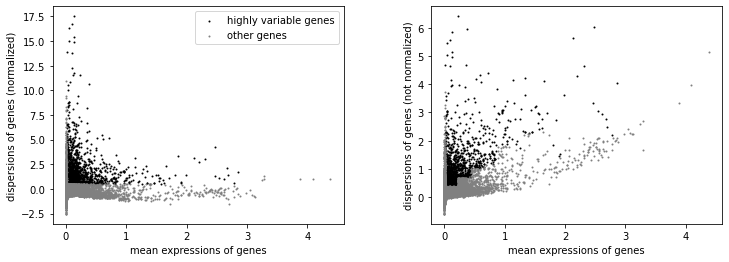

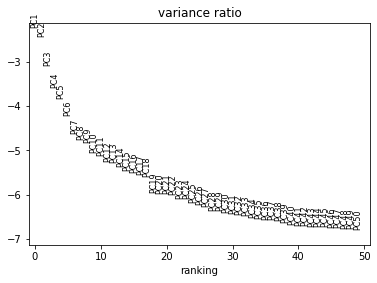

AnnData object with n_obs × n_vars = 6194 × 1605
    obs: 'coarseClusters', 'fineClusters', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'batch'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


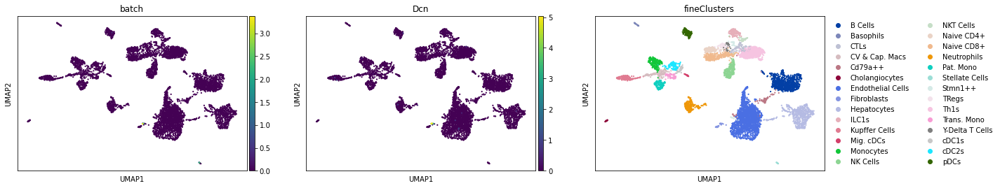

In [35]:
adata=None
print(adata)
'''
dataPath = "/Volumes/Expansion/Hepion/Data/"
for t in treatments:
    Data[t].obs['coarseClusters'].to_csv(f"{dataPath}{t}/coarseClusters.csv", index=True)
    Data[t].obs['fineClusters'].to_csv(f"{dataPath}{t}/fineClusters.csv", index=True)
'''
adata=Data['FriedCRVLAN'].copy()
print(adata)
adata=preprocess.hvg(adata, flavor='seurat')
adata.raw=adata
sc.pp.scale(adata, max_value=10)
preprocess.doPCA(adata, inplace=True)
print(adata)
#preprocess.fullEmbedShebang(adata)
preprocess.umapify(adata, color=['Col3a1','Dcn','fineClusters'], redoPCA=False)
adata=None

/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:208: RuntimeWarning: invalid value encountered in log
  dispersion = np.log(dispersion)
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/Users/JackBrons/miniconda3/lib/python3.8/contextlib.py:120: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


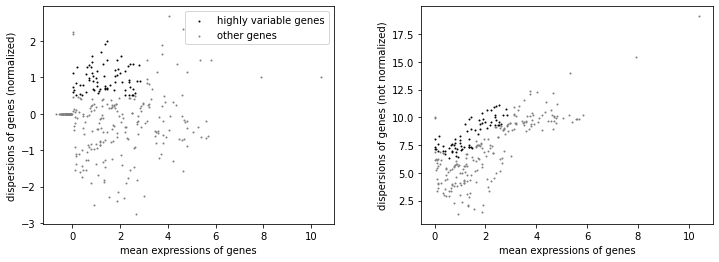

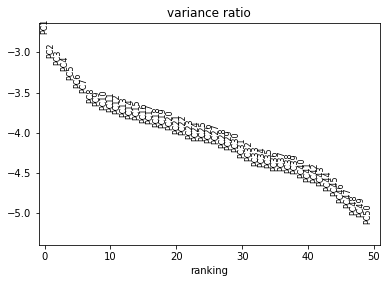

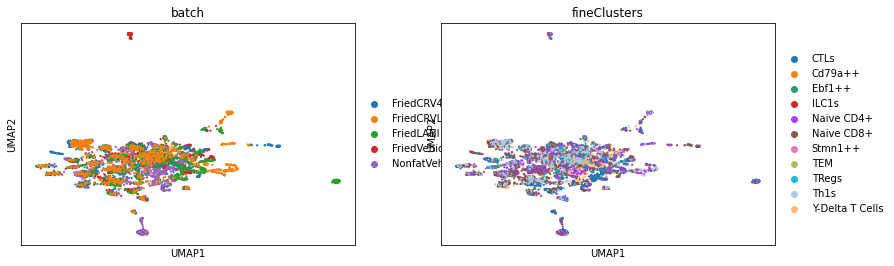

In [10]:
newData = process.batchIt(Data, inplace=False)
adata = process.catAdata(newData, newData.keys(), combat=True)

adata = adata[adata.obs['coarseClusters']=='T Cells']
adata=preprocess.hvg(adata)
preprocess.doPCA(adata)
preprocess.umapify(adata, color=['batch','fineClusters'])

['B Cells' 'Basophils' 'Cd79a++' 'Cholangiocytes' 'Endothelial Cells'
 'ILC1s' 'Mig. cDCs' 'Monocytes' 'NK Cells' 'Neutrophils' 'Stellate Cells'
 'Stmn1++' 'T Cells' 'cDC1s' 'cDC2s' 'pDCs']


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


(2885, 13779)
PCA


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:62: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(


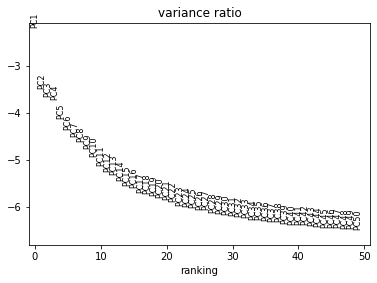

AnnData object with n_obs × n_vars = 2885 × 13779
    obs: 'coarseClusters', 'fineClusters', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'batch', 'n_counts'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
UMAPPING


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


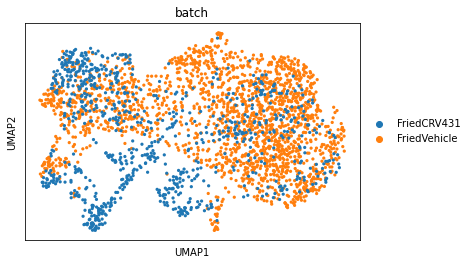

RANKING


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


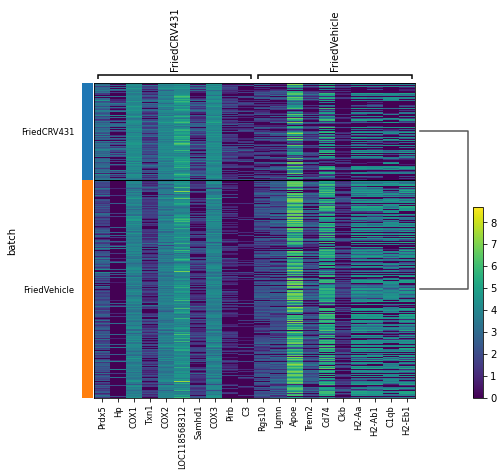

In [87]:
treat1='FriedVehicle'
treat2='FriedCRV431'
depth='coarse' #'macro', 'coarse', 'fine'
cellType='Monocytes'
doUMAP=True
print(np.unique(Data[treat2].obs[f'{depth}Clusters']))


adata = process.catAdata(Data, [treat1, treat2], obsKey=f"{depth}Clusters", obsVal=cellType, normReads=False, combat=False)
adata = adata[:,~adata.var_names.str.startswith(("Rps","Rpl"))]
adata = adata.raw.to_adata()
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)
print(adata.shape)
if doUMAP:
    print("PCA")
    preprocess.doPCA(adata)
    print(adata)
    print("UMAPPING")
    preprocess.umapify(adata, color='batch')
print("RANKING")
sc.tl.rank_genes_groups(adata, 'batch', method='wilcoxon', use_raw=False, max_iter=2000, pts=False, use_rep='X')
sc.tl.dendrogram(adata, groupby='batch')
sc.pl.rank_genes_groups_heatmap(adata)
#sc.tl.rank_genes_groups(adata, 'batch', method='logreg', max_iter=2000, pts=True)

/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


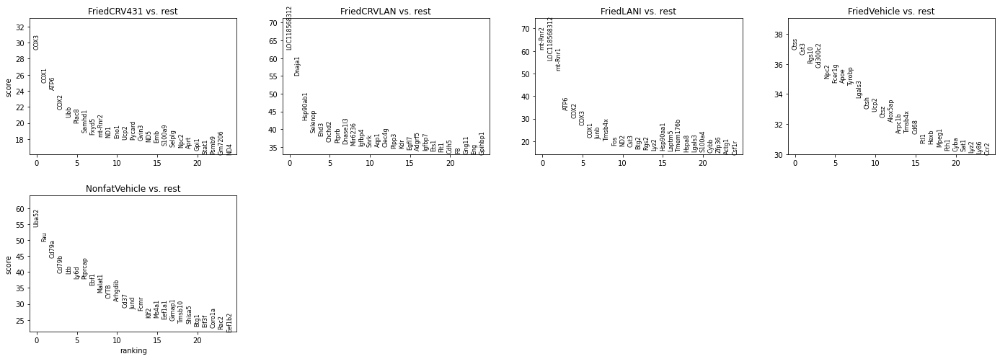

         Falling back to preprocessing with `sc.pp.pca` and default params.


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


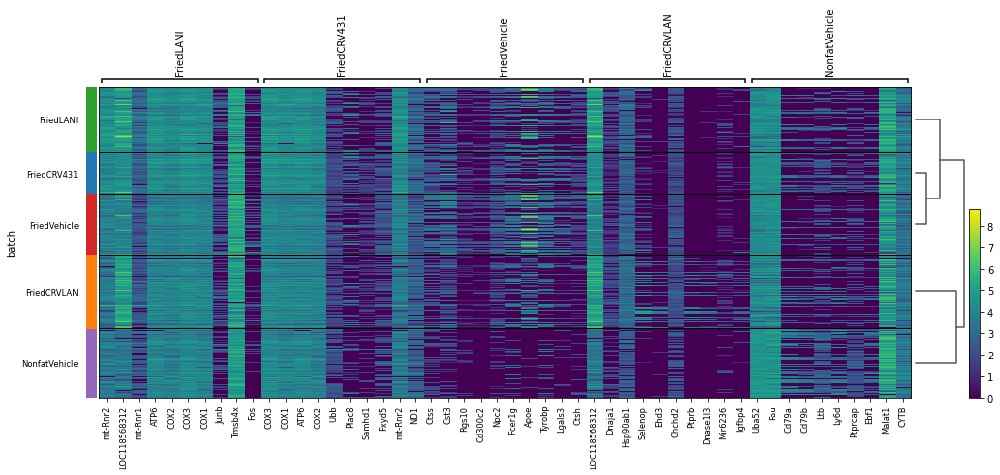

/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:399: PerformanceWarning: DataFrame i

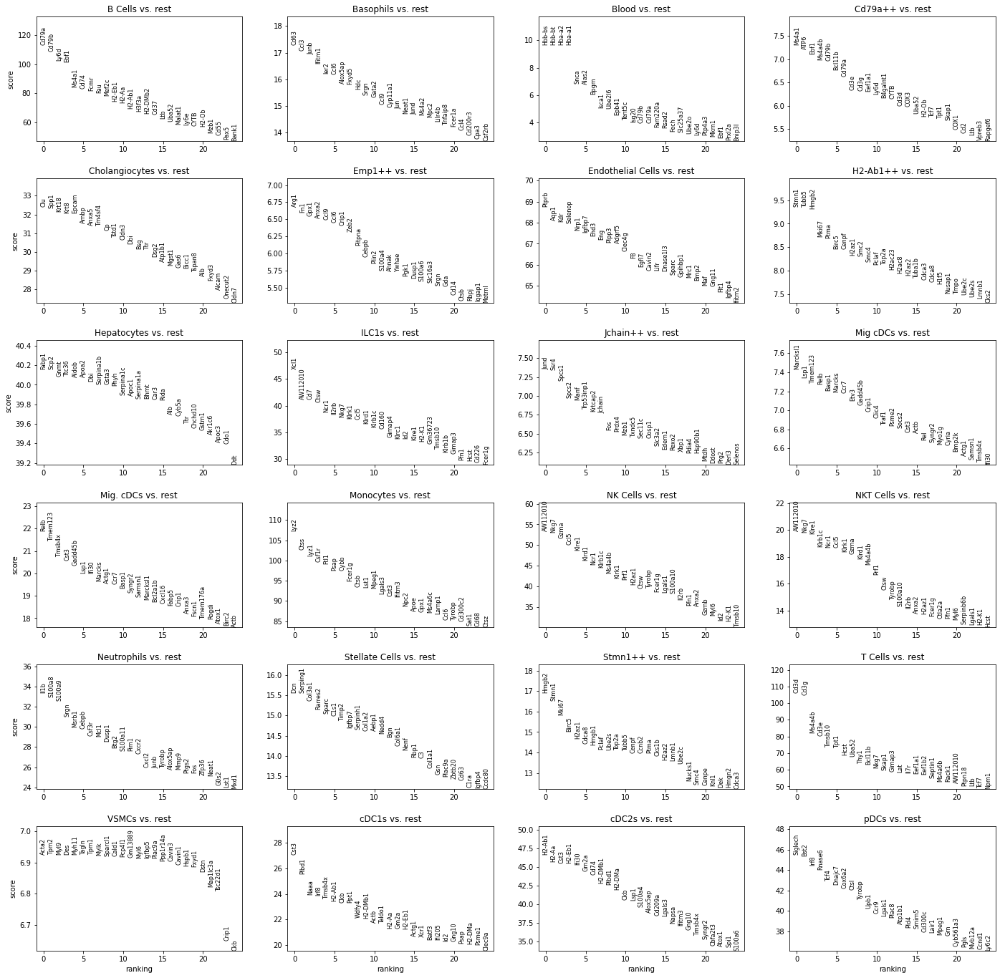

/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


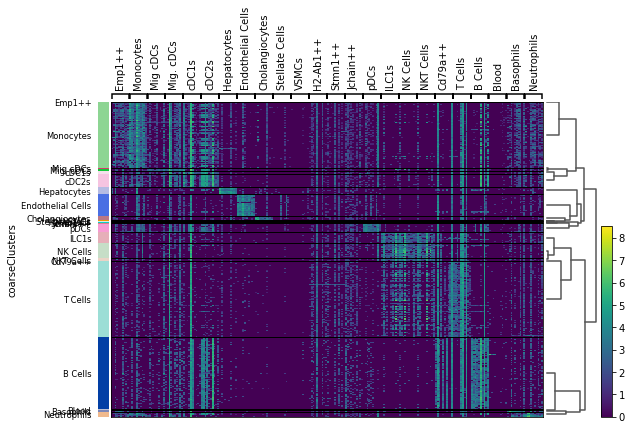

/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


KeyboardInterrupt: 

In [73]:
### Dendrogram across all treatments
adata = process.catAdata(Data, treatments, normReads=False, combat=False)
adata = adata.raw.to_adata()
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

#adata = adata[adata.obs['coarseClusters'] == 'Monocytes',:]
#adata.obs['coarseClusters'].value_counts()
adata = adata[:,~adata.var_names.str.startswith(("Rps","Rpl"))]

sc.tl.rank_genes_groups(adata, 'batch', method='wilcoxon', use_raw=False, max_iter=2000, pts=False)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)
sc.tl.dendrogram(adata, groupby='batch')
sc.pl.rank_genes_groups_heatmap(adata)

sc.tl.rank_genes_groups(adata, 'coarseClusters', method='wilcoxon', use_raw=False, max_iter=2000, pts=False)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)
sc.tl.dendrogram(adata, groupby='coarseClusters')
sc.pl.rank_genes_groups_heatmap(adata)

adata=adata[adata.obs['batch']!='NonfatVehicle']
sc.tl.rank_genes_groups(adata, 'batch', method='wilcoxon', use_raw=False, max_iter=2000, pts=False)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)
sc.tl.dendrogram(adata, groupby='batch')
sc.pl.rank_genes_groups_heatmap(adata)

/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


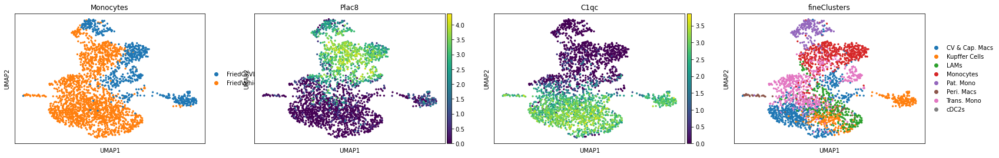

In [6]:
#preprocess.umapify(adata, color='fineClusters')
#sc.pl.umap(adata, color='fineClusters', title=cellType, legend_loc='on data')
sc.pl.umap(adata, color=['batch','Plac8','C1qc','fineClusters'], title=cellType)

In [18]:

print(adata.obs['batch'][-1])

dgeDF = process.tablize(adata, index=True, treatment=[treat1,treat2], cellType=cellType)

print(dgeDF[dgeDF['pvals_adj']<0.05].sort_values('pvals_adj').head(450))
#sc.pl.umap(adata, color=dgeDF[dgeDF['pvals_adj']<0.05].sort_values('pvals_adj').index, legend_loc='on data')

FriedCRVLAN
                         treatment baseTreatment contrastTreatment   cellType  \
Dntt    FriedVehicle x FriedCRVLAN  FriedVehicle       FriedCRVLAN  Monocytes   
Tshz2   FriedVehicle x FriedCRVLAN  FriedVehicle       FriedCRVLAN  Monocytes   
Ccr7    FriedVehicle x FriedCRVLAN  FriedVehicle       FriedCRVLAN  Monocytes   
Cxcr2   FriedVehicle x FriedCRVLAN  FriedVehicle       FriedCRVLAN  Monocytes   
Vpreb3  FriedVehicle x FriedCRVLAN  FriedVehicle       FriedCRVLAN  Monocytes   
...                            ...           ...               ...        ...   
Bhmt    FriedVehicle x FriedCRVLAN  FriedVehicle       FriedCRVLAN  Monocytes   
H2-Ob   FriedVehicle x FriedCRVLAN  FriedVehicle       FriedCRVLAN  Monocytes   
Csf1    FriedVehicle x FriedCRVLAN  FriedVehicle       FriedCRVLAN  Monocytes   
H2ac8   FriedVehicle x FriedCRVLAN  FriedVehicle       FriedCRVLAN  Monocytes   
Ehd3    FriedVehicle x FriedCRVLAN  FriedVehicle       FriedCRVLAN  Monocytes   

         genes 

In [38]:
print(list(adata.uns['rank_genes_groups'].keys()))

['params', 'pts', 'pts_rest', 'names', 'scores', 'pvals', 'pvals_adj', 'logfoldchanges']


FriedCRVLAN


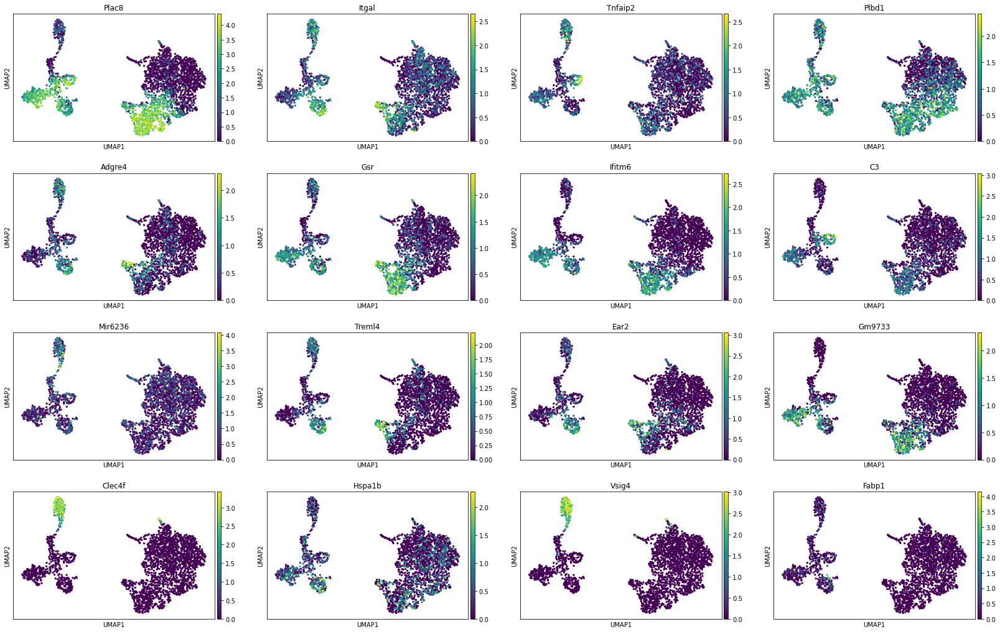

FriedVehicle


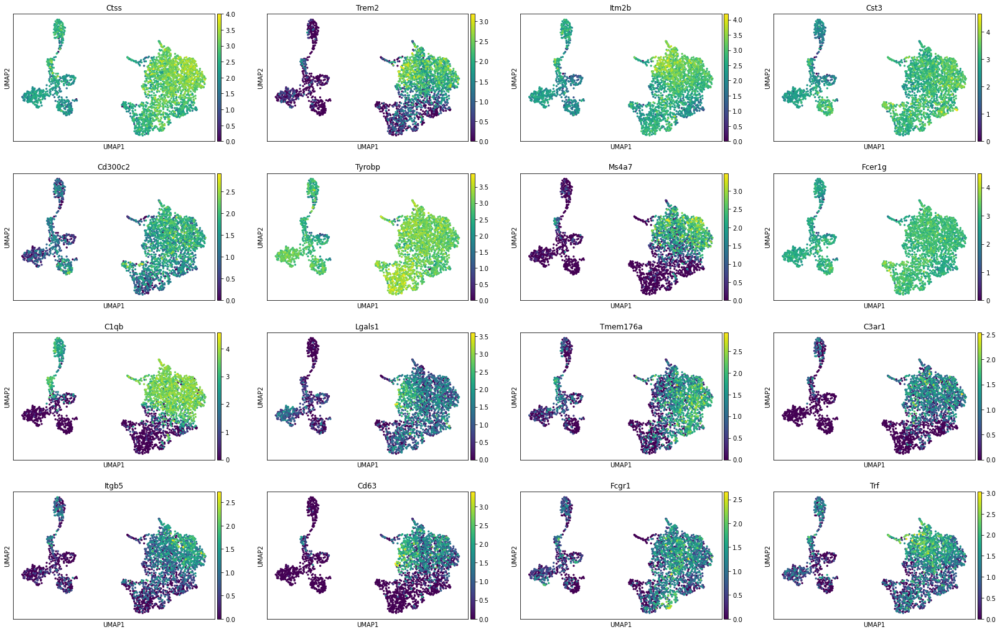

/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


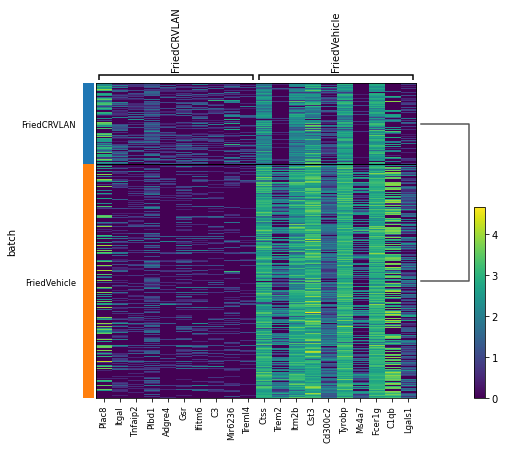

In [19]:
#sc.tl.rank_genes_groups(adata, 'batch', method='logreg', max_iter=2000)
#sc.tl.rank_genes_groups(adata, 'batch', method='wilcoxon')
sc.tl.rank_genes_groups(adata, 'batch', method='wilcoxon', use_raw=Fals ]\
                        e, max_iter=2000, pts=False)'
sc.tl.umap(adata)
for val in np.unique(adata.obs['batch']):
    print(val)
    #print(adata.uns['rank_genes_groups'])
    sc.pl.umap(adata, color=adata.uns['rank_genes_groups']['names'][str(val)][:16])
sc.tl.dendrogram(adata, groupby='batch')
sc.pl.rank_genes_groups_heatmap(adata)
#sc.pl.umap(adata, color=['fineClusters', 'batch'])

In [11]:
### Make a df of all the dge results

coarseOrFine = 'fine'

t0=time.time()
combinedData = process.catAdata(Data, treatments, normReads=False, combat=False)
combinedData = process.dgeNorm(combinedData)

#combinedData = combinedData.raw.to_adata()
#sc.pp.normalize_total(combinedData)
#sc.pp.log1p(combinedData)
# ?
#sc.pp.scale(combinedData)
print(f"Norming Means Finished: {time.time()-t0}s")
'''
dfs=[]
for i, treat1 in enumerate(treatments):
    print(treat1)
    for j, treat2 in enumerate(treatments):
        if j>i:
            cellTypes = np.unique(Data[treat2].obs[f'{coarseOrFine}Clusters'])
            adata = combinedData[(combinedData.obs['batch']==treat1) | (combinedData.obs['batch']==treat2)]
            for celltype in cellTypes:
                if celltype in np.unique(Data[treat1].obs[f'{coarseOrFine}Clusters']):
                    print(f"{treat1} {treat2} {celltype}")
                    cellTypeAdata = adata[adata.obs[f"{coarseOrFine}Clusters"]==celltype]
                    sc.tl.rank_genes_groups(cellTypeAdata, 'batch', groups=[treat2], reference=treat1, use_raw=False, method='wilcoxon', max_iter=2000, pts=False)
                    dgeDF = process.tablize(cellTypeAdata, index=True, treatment=[treat1,treat2], cellType=celltype, counts=False)

                    dfs.append(dgeDF)
adata=None
totalDF = pd.concat(dfs, ignore_index=True)
'''
totalDF = process.doDGE(combinedData, treatments, obsKey = f'{coarseOrFine}Clusters')

print("\nFinished")


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Norming Means Finished: 8.623344898223877s
NonfatVehicle
['B Cells', 'Basophils', 'CTLs', 'ILC1s', 'Monocytes', 'NK Cells', 'Naive CD4+', 'Naive CD8+', 'Neutrophils', 'Peri. Macs', 'Y-Delta T Cells', 'pDCs']
NonfatVehicle FriedVehicle B Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedVehicle Basophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedVehicle CTLs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedVehicle ILC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedVehicle Monocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedVehicle NK Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedVehicle Naive CD4+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedVehicle Naive CD8+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedVehicle Neutrophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedVehicle Peri. Macs
NonfatVehicle FriedVehicle Y-Delta T Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedVehicle pDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


['B Cells', 'Basophils', 'CTLs', 'ILC1s', 'Monocytes', 'NK Cells', 'Naive CD4+', 'Naive CD8+', 'Neutrophils', 'Y-Delta T Cells', 'pDCs']
NonfatVehicle FriedCRV431 B Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedCRV431 Basophils
NonfatVehicle FriedCRV431 CTLs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedCRV431 ILC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedCRV431 Monocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedCRV431 NK Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedCRV431 Naive CD4+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedCRV431 Naive CD8+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedCRV431 Neutrophils
NonfatVehicle FriedCRV431 Y-Delta T Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedCRV431 pDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


['B Cells', 'Basophils', 'CTLs', 'ILC1s', 'Monocytes', 'NK Cells', 'Naive CD4+', 'Naive CD8+', 'Neutrophils', 'Peri. Macs', 'Y-Delta T Cells', 'pDCs']
NonfatVehicle FriedLANI B Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedLANI Basophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedLANI CTLs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedLANI ILC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedLANI Monocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedLANI NK Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedLANI Naive CD4+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedLANI Naive CD8+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedLANI Neutrophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedLANI Peri. Macs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedLANI Y-Delta T Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedLANI pDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


['B Cells', 'Basophils', 'CTLs', 'ILC1s', 'Monocytes', 'NK Cells', 'Naive CD4+', 'Naive CD8+', 'Neutrophils', 'Y-Delta T Cells', 'pDCs']
NonfatVehicle FriedCRVLAN B Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedCRVLAN Basophils
NonfatVehicle FriedCRVLAN CTLs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedCRVLAN ILC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedCRVLAN Monocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedCRVLAN NK Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedCRVLAN Naive CD4+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedCRVLAN Naive CD8+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedCRVLAN Neutrophils
NonfatVehicle FriedCRVLAN Y-Delta T Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


NonfatVehicle FriedCRVLAN pDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle
['B Cells', 'Basophils', 'CTLs', 'CV & Cap. Macs', 'Cholangiocytes', 'Endothelial Cells', 'ILC1s', 'LAMs', 'Mig. cDCs', 'Monocytes', 'NK Cells', 'Naive CD4+', 'Naive CD8+', 'Neutrophils', 'Pat. Mono', 'Stellate Cells', 'Stmn1++', 'TRegs', 'Trans. Mono', 'Y-Delta T Cells', 'cDC1s', 'cDC2s', 'pDCs']
FriedVehicle FriedCRV431 B Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRV431 Basophils
FriedVehicle FriedCRV431 CTLs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRV431 CV & Cap. Macs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRV431 Cholangiocytes
FriedVehicle FriedCRV431 Endothelial Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRV431 ILC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRV431 LAMs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRV431 Mig. cDCs
FriedVehicle FriedCRV431 Monocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRV431 NK Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRV431 Naive CD4+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRV431 Naive CD8+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRV431 Neutrophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRV431 Pat. Mono


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRV431 Stellate Cells
FriedVehicle FriedCRV431 Stmn1++


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRV431 TRegs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRV431 Trans. Mono


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRV431 Y-Delta T Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRV431 cDC1s
FriedVehicle FriedCRV431 cDC2s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRV431 pDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


['B Cells', 'Basophils', 'CTLs', 'CV & Cap. Macs', 'Cholangiocytes', 'Endothelial Cells', 'Hepatocytes', 'ILC1s', 'Jchain++', 'Kupffer Cells', 'LAMs', 'Mig. cDCs', 'Monocytes', 'NK Cells', 'Naive CD4+', 'Naive CD8+', 'Neutrophils', 'Pat. Mono', 'Peri. Macs', 'Stellate Cells', 'Stmn1++', 'TRegs', 'Trans. Mono', 'Y-Delta T Cells', 'cDC1s', 'cDC2s', 'pDCs']
FriedVehicle FriedLANI B Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedLANI Basophils
FriedVehicle FriedLANI CTLs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedLANI CV & Cap. Macs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedLANI Cholangiocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedLANI Endothelial Cells
FriedVehicle FriedLANI Hepatocytes
FriedVehicle FriedLANI ILC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedLANI Jchain++
FriedVehicle FriedLANI Kupffer Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedLANI LAMs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedLANI Mig. cDCs
FriedVehicle FriedLANI Monocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedLANI NK Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedLANI Naive CD4+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedLANI Naive CD8+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedLANI Neutrophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedLANI Pat. Mono


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedLANI Peri. Macs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedLANI Stellate Cells
FriedVehicle FriedLANI Stmn1++


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedLANI TRegs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedLANI Trans. Mono


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedLANI Y-Delta T Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedLANI cDC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedLANI cDC2s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedLANI pDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


['B Cells', 'Basophils', 'CTLs', 'CV & Cap. Macs', 'Cholangiocytes', 'Endothelial Cells', 'Hepatocytes', 'ILC1s', 'Kupffer Cells', 'LAMs', 'Mig. cDCs', 'Monocytes', 'NK Cells', 'Naive CD4+', 'Naive CD8+', 'Neutrophils', 'Pat. Mono', 'Stellate Cells', 'Stmn1++', 'TRegs', 'Trans. Mono', 'Y-Delta T Cells', 'cDC1s', 'cDC2s', 'pDCs']
FriedVehicle FriedCRVLAN B Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRVLAN Basophils
FriedVehicle FriedCRVLAN CTLs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRVLAN CV & Cap. Macs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRVLAN Cholangiocytes
FriedVehicle FriedCRVLAN Endothelial Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRVLAN Hepatocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRVLAN ILC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRVLAN Kupffer Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRVLAN LAMs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRVLAN Mig. cDCs
FriedVehicle FriedCRVLAN Monocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRVLAN NK Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRVLAN Naive CD4+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRVLAN Naive CD8+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRVLAN Neutrophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRVLAN Pat. Mono


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRVLAN Stellate Cells
FriedVehicle FriedCRVLAN Stmn1++


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRVLAN TRegs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRVLAN Trans. Mono


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRVLAN Y-Delta T Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRVLAN cDC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRVLAN cDC2s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedVehicle FriedCRVLAN pDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431
['B Cells', 'Basophils', 'CTLs', 'CV & Cap. Macs', 'Cd79a++', 'Cholangiocytes', 'Endothelial Cells', 'ILC1s', 'LAMs', 'Mig. cDCs', 'Monocytes', 'NK Cells', 'Naive CD4+', 'Naive CD8+', 'Neutrophils', 'Pat. Mono', 'Stellate Cells', 'Stmn1++', 'TRegs', 'Trans. Mono', 'Y-Delta T Cells', 'cDC1s', 'cDC2s', 'pDCs']
FriedCRV431 FriedLANI B Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedLANI Basophils
FriedCRV431 FriedLANI CTLs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedLANI CV & Cap. Macs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedLANI Cd79a++
FriedCRV431 FriedLANI Cholangiocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedLANI Endothelial Cells
FriedCRV431 FriedLANI ILC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedLANI LAMs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedLANI Mig. cDCs
FriedCRV431 FriedLANI Monocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedLANI NK Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedLANI Naive CD4+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedLANI Naive CD8+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedLANI Neutrophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedLANI Pat. Mono


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedLANI Stellate Cells
FriedCRV431 FriedLANI Stmn1++


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedLANI TRegs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedLANI Trans. Mono


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedLANI Y-Delta T Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedLANI cDC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedLANI cDC2s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedLANI pDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


['B Cells', 'Basophils', 'CTLs', 'CV & Cap. Macs', 'Cholangiocytes', 'Endothelial Cells', 'ILC1s', 'LAMs', 'Mig. cDCs', 'Monocytes', 'NK Cells', 'Naive CD4+', 'Naive CD8+', 'Neutrophils', 'Pat. Mono', 'Stellate Cells', 'Stmn1++', 'TRegs', 'Trans. Mono', 'Y-Delta T Cells', 'cDC1s', 'cDC2s', 'pDCs']
FriedCRV431 FriedCRVLAN B Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedCRVLAN Basophils
FriedCRV431 FriedCRVLAN CTLs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedCRVLAN CV & Cap. Macs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedCRVLAN Cholangiocytes
FriedCRV431 FriedCRVLAN Endothelial Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedCRVLAN ILC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedCRVLAN LAMs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedCRVLAN Mig. cDCs
FriedCRV431 FriedCRVLAN Monocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedCRVLAN NK Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedCRVLAN Naive CD4+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedCRVLAN Naive CD8+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedCRVLAN Neutrophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedCRVLAN Pat. Mono


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedCRVLAN Stellate Cells
FriedCRV431 FriedCRVLAN Stmn1++


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedCRVLAN TRegs
FriedCRV431 FriedCRVLAN Trans. Mono


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedCRVLAN Y-Delta T Cells
FriedCRV431 FriedCRVLAN cDC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedCRVLAN cDC2s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRV431 FriedCRVLAN pDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedLANI
['B Cells', 'Basophils', 'CTLs', 'CV & Cap. Macs', 'Cholangiocytes', 'Endothelial Cells', 'Hepatocytes', 'ILC1s', 'Kupffer Cells', 'LAMs', 'Mig. cDCs', 'Monocytes', 'NK Cells', 'Naive CD4+', 'Naive CD8+', 'Neutrophils', 'Pat. Mono', 'Stellate Cells', 'Stmn1++', 'TRegs', 'Trans. Mono', 'Y-Delta T Cells', 'cDC1s', 'cDC2s', 'pDCs']
FriedLANI FriedCRVLAN B Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedLANI FriedCRVLAN Basophils
FriedLANI FriedCRVLAN CTLs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedLANI FriedCRVLAN CV & Cap. Macs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedLANI FriedCRVLAN Cholangiocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedLANI FriedCRVLAN Endothelial Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedLANI FriedCRVLAN Hepatocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedLANI FriedCRVLAN ILC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedLANI FriedCRVLAN Kupffer Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedLANI FriedCRVLAN LAMs
FriedLANI FriedCRVLAN Mig. cDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedLANI FriedCRVLAN Monocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedLANI FriedCRVLAN NK Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedLANI FriedCRVLAN Naive CD4+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedLANI FriedCRVLAN Naive CD8+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedLANI FriedCRVLAN Neutrophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedLANI FriedCRVLAN Pat. Mono


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedLANI FriedCRVLAN Stellate Cells
FriedLANI FriedCRVLAN Stmn1++


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedLANI FriedCRVLAN TRegs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedLANI FriedCRVLAN Trans. Mono


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedLANI FriedCRVLAN Y-Delta T Cells
FriedLANI FriedCRVLAN cDC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedLANI FriedCRVLAN cDC2s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedLANI FriedCRVLAN pDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


FriedCRVLAN

Finished


In [12]:
print(totalDF)

                            treatment  baseTreatment contrastTreatment  \
0        NonfatVehicle x FriedVehicle  NonfatVehicle      FriedVehicle   
1        NonfatVehicle x FriedVehicle  NonfatVehicle      FriedVehicle   
2        NonfatVehicle x FriedVehicle  NonfatVehicle      FriedVehicle   
3        NonfatVehicle x FriedVehicle  NonfatVehicle      FriedVehicle   
4        NonfatVehicle x FriedVehicle  NonfatVehicle      FriedVehicle   
...                               ...            ...               ...   
2323715       FriedLANI x FriedCRVLAN      FriedLANI       FriedCRVLAN   
2323716       FriedLANI x FriedCRVLAN      FriedLANI       FriedCRVLAN   
2323717       FriedLANI x FriedCRVLAN      FriedLANI       FriedCRVLAN   
2323718       FriedLANI x FriedCRVLAN      FriedLANI       FriedCRVLAN   
2323719       FriedLANI x FriedCRVLAN      FriedLANI       FriedCRVLAN   

        cellType         genes     scores pvals pvals_adj logfoldchanges  
0        B Cells       mt-Rnr2  20.7

In [ ]:
### To do Scar-associated Macrophages if wanted
doSAMS = False
dfs=[]
if doSAMs and coarseOrFine=='fine':
    for i, treat1 in enumerate(treatments):
        print(treat1)
        for j, treat2 in enumerate(treatments):
            if j>i:
                adata = combinedData[(combinedData.obs['batch']==treat1) | (combinedData.obs['batch']==treat2)]
                adata = adata[(adata.obs['fineClusters']=='LAMs') | (adata.obs['fineClusters']=='CV & Cap. Macs')]
                sc.tl.rank_genes_groups(adata, 'batch', groups=[treat2], reference=treat1, use_raw=False, method='wilcoxon', max_iter=2000, pts=False)
                dgeDF = process.tablize(adata, index=True, treatment=[treat1,treat2], cellType='SAMs', counts=False)
                adata=None
                totalDF = pd.concat([totalDF,dgeDF], ignore_index=True)
                

In [13]:
### Add counts to DF
t0 = time.time()
depth='fine'
otherDF = totalDF

print("Normalizing")
combinedData = process.catAdata(Data, treatments, normReads=False, combat=False)
combinedData = process.dgeNorm(combinedData)
'''
for i,t in enumerate(treatments):
    print(f"\nOn treatment {t}")
    adata = combinedData[combinedData.obs['batch']==t]
    col=[]
    col2=[]
    
    arr=[]
    ### Create a matrix of mean gene expressions for all cell in a cellType
    ### Precomputing this speeds up data extraction significantly
    print("Calculating EXP")
    adata.X=np.expm1(adata.X)
    
    print("Making meanMatrixDF")
    for cluster in np.unique(otherDF['cellType']):
        if cluster in np.unique(adata.obs[f'{depth}Clusters']):
            arr.append(np.asarray(adata[adata.obs[f'{depth}Clusters']==cluster].X.mean(axis=0))[0])
        else:
            arr.append([np.nan]*otherDF.shape[1])
    meanMatrixDF = pd.DataFrame(arr, index=np.unique(otherDF['cellType']), columns=adata.var.index)
    #print(meanMatrixDF)
    
    print("Making cellMatrix")
    cellCounts=[]
    for cluster in np.unique(otherDF['cellType']):
        cellCounts.append(adata[adata.obs[f'{depth}Clusters']==cluster].shape[0])
    cellCountDF = pd.DataFrame(cellCounts, index=np.unique(otherDF['cellType']), columns=['cellCounts'])
    
    
    print("Appending reads to DF")
    for index, row in otherDF.iterrows():
        cluster = row['cellType']
        gene = row['genes']
        col.append(meanMatrixDF.loc[cluster, gene])
        col2.append(cellCountDF.loc[cluster,'cellCounts'])
        #col2.append(adata[adata.obs[f'{depth}Clusters']==cluster].shape[0])
    otherDF[t]=col
    otherDF[t+'_cells']=col2
    
    adata.X=np.log1p(adata.X)
    
cells = [t+'_cells' for t in treatments]
cols=otherDF.columns[:9].tolist()+ treatments + cells
otherDF = otherDF[cols]
'''
otherDF = addReadCounts(totalDF, combinedData, treatments, obsKey=f'{depth}Clusters')

print(otherDF)
t1 = time.time()
print(f"Total Time Elapsed: {t1-t0}")

Normalizing


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")



On treatment NonfatVehicle
Calculating EXP
Making meanMatrixDF
Making cellMatrix
Appending reads to DF

On treatment FriedVehicle
Calculating EXP
Making meanMatrixDF
Making cellMatrix
Appending reads to DF

On treatment FriedCRV431
Calculating EXP
Making meanMatrixDF
Making cellMatrix
Appending reads to DF

On treatment FriedLANI
Calculating EXP
Making meanMatrixDF
Making cellMatrix
Appending reads to DF

On treatment FriedCRVLAN
Calculating EXP
Making meanMatrixDF
Making cellMatrix
Appending reads to DF
                            treatment  baseTreatment contrastTreatment  \
0        NonfatVehicle x FriedVehicle  NonfatVehicle      FriedVehicle   
1        NonfatVehicle x FriedVehicle  NonfatVehicle      FriedVehicle   
2        NonfatVehicle x FriedVehicle  NonfatVehicle      FriedVehicle   
3        NonfatVehicle x FriedVehicle  NonfatVehicle      FriedVehicle   
4        NonfatVehicle x FriedVehicle  NonfatVehicle      FriedVehicle   
...                               ...        

In [24]:
print(Data['FriedVehicle'][Data['FriedVehicle'].obs['coarseClusters']=='B Cells'][:,'COX3'].X)

  (0, 0)	3.8617127
  (1, 0)	3.617882
  (2, 0)	4.043742
  (3, 0)	3.7477226
  (4, 0)	4.2600293
  (5, 0)	4.0669217
  (6, 0)	3.9644504
  (7, 0)	3.568932
  (8, 0)	4.4039354
  (9, 0)	3.399342
  (10, 0)	3.9282956
  (11, 0)	3.6462946
  (12, 0)	3.879582
  (13, 0)	4.177157
  (14, 0)	3.9381378
  (15, 0)	4.382402
  (16, 0)	3.8837368
  (17, 0)	3.969526
  (18, 0)	4.176638
  (19, 0)	4.6204047
  (20, 0)	3.7068062
  (21, 0)	4.1725764
  (22, 0)	2.9128187
  (23, 0)	3.933557
  (24, 0)	4.2413397
  :	:
  (490, 0)	3.7356348
  (491, 0)	4.318055
  (492, 0)	4.2262225
  (493, 0)	3.7892592
  (494, 0)	3.9277797
  (495, 0)	3.2125928
  (496, 0)	4.0548234
  (497, 0)	4.0539823
  (498, 0)	4.035859
  (499, 0)	3.7982774
  (500, 0)	3.8079998
  (501, 0)	3.6064172
  (502, 0)	4.521624
  (503, 0)	4.0762835
  (504, 0)	4.1458282
  (505, 0)	3.8439724
  (506, 0)	3.9145703
  (507, 0)	4.348762
  (508, 0)	4.114645
  (509, 0)	4.281248
  (510, 0)	3.629235
  (511, 0)	3.7745268
  (512, 0)	3.6497486
  (513, 0)	2.8935382
  (514, 0)	4.1350

In [ ]:
#otherDF[otherDF['pvals_adj']<0.5].sort_values('cellType').to_csv(f"{depth}DGEResults.csv", index=False)
#otherDF = otherDF[ (otherDF[otherDF[otherDF['baseTreatment']]>0.05]) & (otherDF[otherDF[otherDF['contrastTreatment']]>0.05])]
print("Filter 1")
outputDF = otherDF[otherDF.pvals<=0.05]
print("Filter 2")
outputDF = outputDF[np.abs(outputDF.logfoldchanges)>0.75]
print("Filter 3")
outputDF = outputDF[ outputDF[outputDF['baseTreatment']] >0.05]
print("Filter 4")
outputDF = outputDF[ outputDF[outputDF['contrastTreatment']] >0.05]
print("Making Spreadsheet")
out.makeSpreadsheet(outputDF, filename=f"{depth}DGE_results.xlsx", sheetKey='cellType', sortKey='pvals_adj')



Filter 1


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


NonfatVehicle x FriedVehicle


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


B Cells
B Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.744376324415283


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


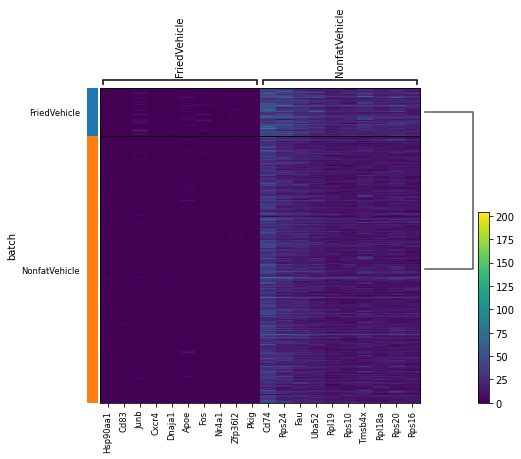

Basophils
Basophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.749125952840095


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


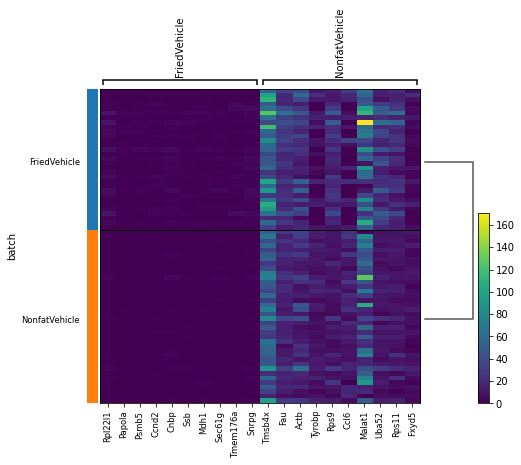

Blood
CTLs
CTLs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.8631096079988487


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


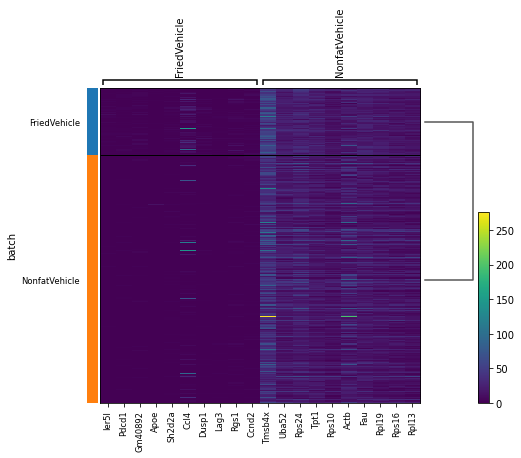

CV & Cap. Macs
Cd79a++
Cholangiocytes
Ebf1++
Emp1++
Endothelial Cells
H2-Ab1++
Hepatocytes
ILC1s
ILC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.8967537343527469


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


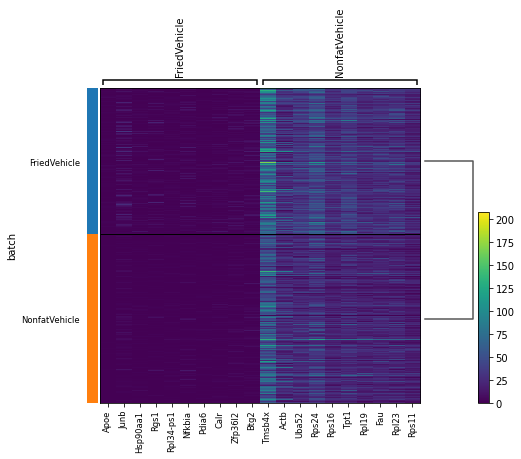

Jchain++
Kupffer Cells
LAMs
Mig. cDCs
Monocytes
Monocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.4834171981212599


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


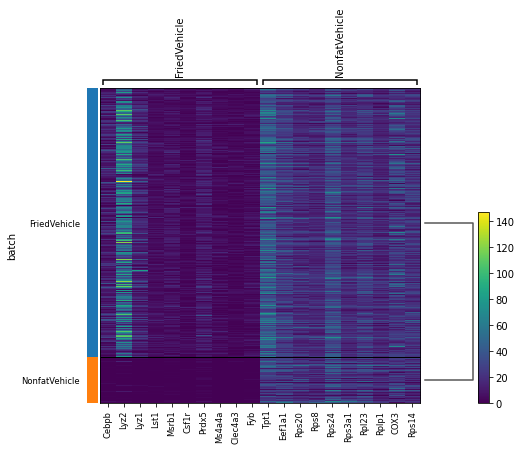

NK Cells
NK Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.8343175660761595


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


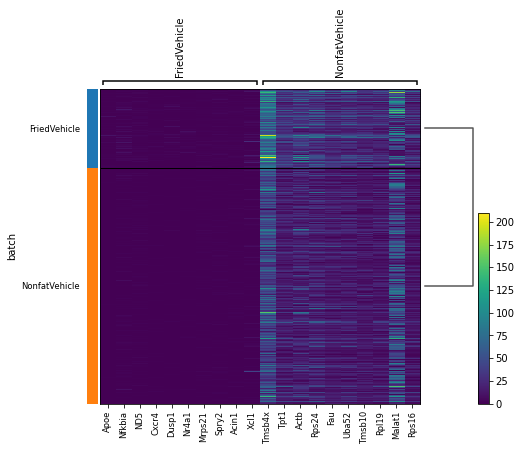

NKT Cells
Naive CD4+
Naive CD4+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.8737585761298176


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


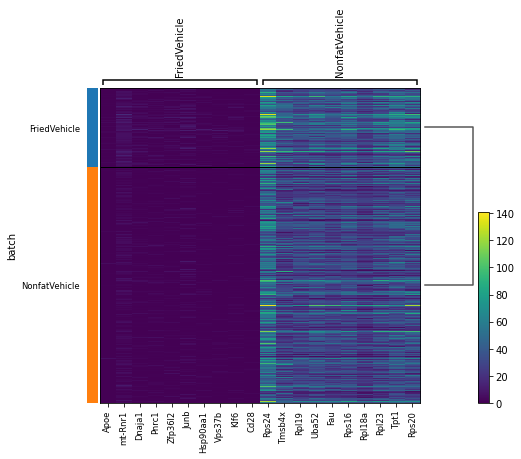

Naive CD8+
Naive CD8+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.7793582971767108


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


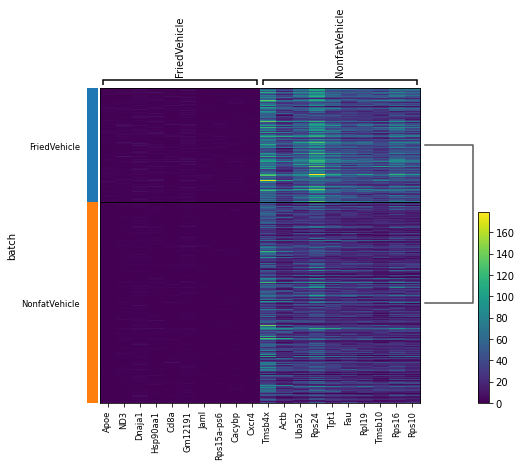

Neutrophils
Neutrophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.7663878112151825


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


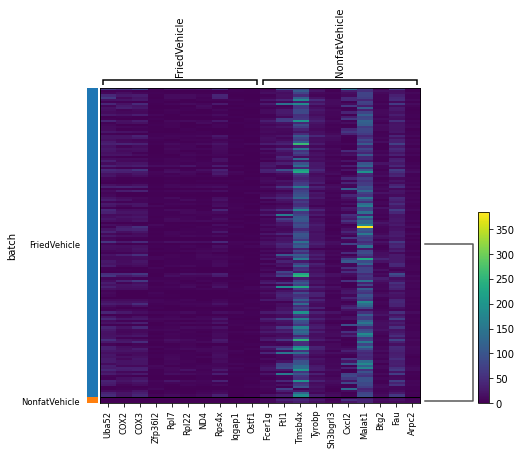

Pat. Mono
Peri. Macs
Peri. Macs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.7939123562734711


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


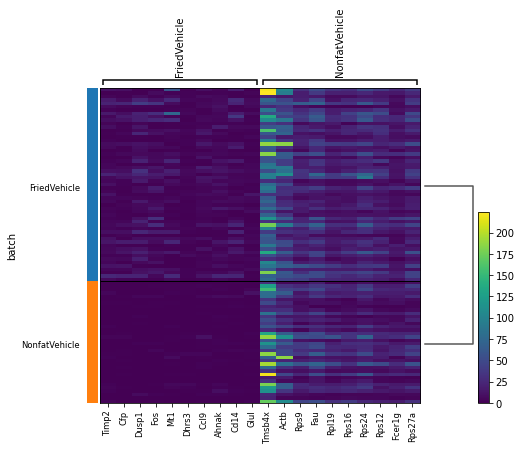

Stellate Cells
Stmn1++
TEM
TRegs
Th1s
Trans. Mono
VSMCs
Y-Delta T Cells
Y-Delta T Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.8718493739473149


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


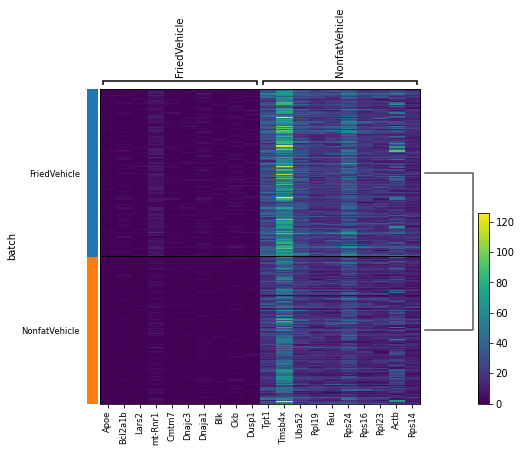

cDC1s
cDC2s
pDCs
pDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9580776762579841


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


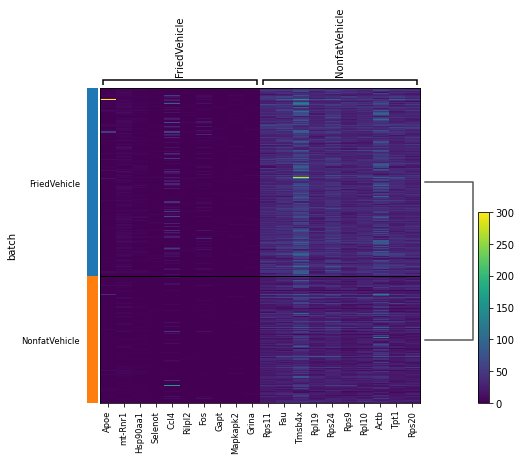

NonfatVehicle x FriedCRV431


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


B Cells
B Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.27845191060609525


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


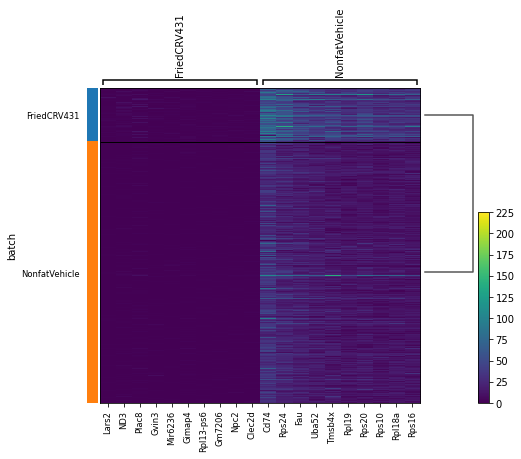

Basophils
Basophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.8702934437299358


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


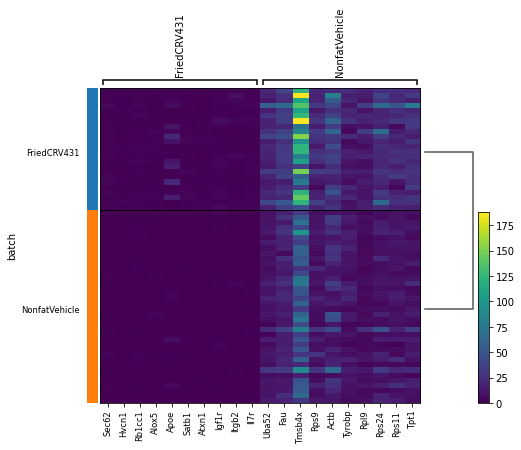

Blood
CTLs
CTLs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.517622699124019


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


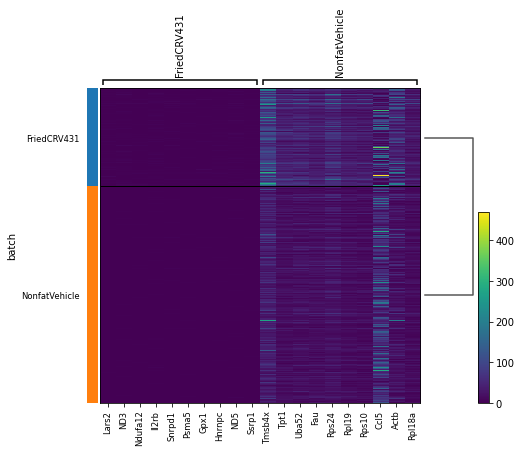

CV & Cap. Macs
Cd79a++
Cholangiocytes
Ebf1++
Emp1++
Endothelial Cells
H2-Ab1++
Hepatocytes
ILC1s
ILC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.8544479912675778


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


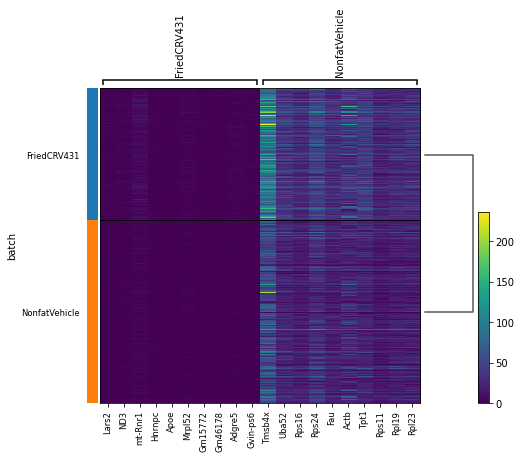

Jchain++
Kupffer Cells
LAMs
Mig. cDCs
Monocytes
Monocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.5522106762473326


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


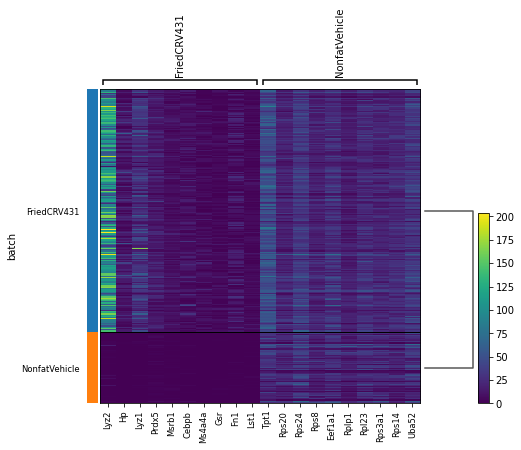

NK Cells
NK Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.6703900588880882


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


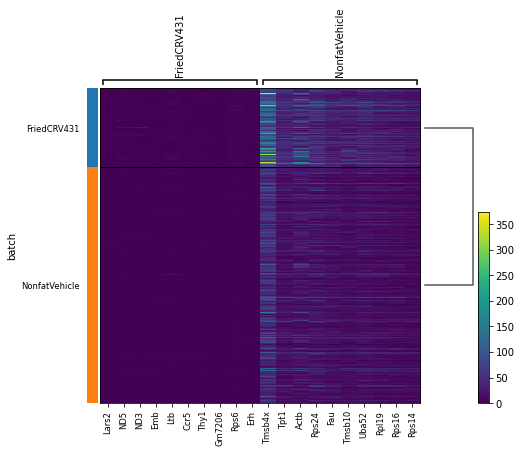

NKT Cells
Naive CD4+
Naive CD4+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.7791719117497429


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


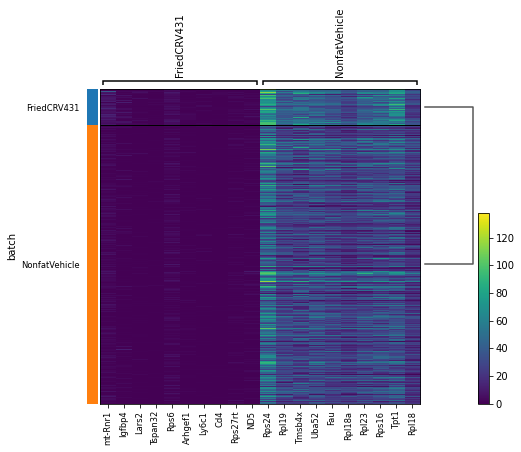

Naive CD8+
Naive CD8+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.6012640952824727


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


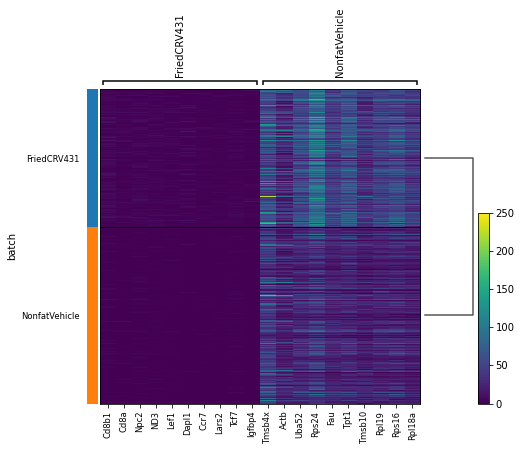

Neutrophils
Neutrophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.5851866141862466


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


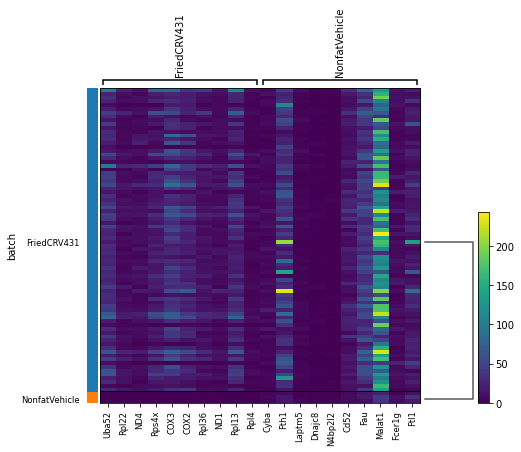

Pat. Mono
Peri. Macs
Stellate Cells
Stmn1++
TEM
TRegs
Th1s
Trans. Mono
VSMCs
Y-Delta T Cells
Y-Delta T Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.7629230119567607


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


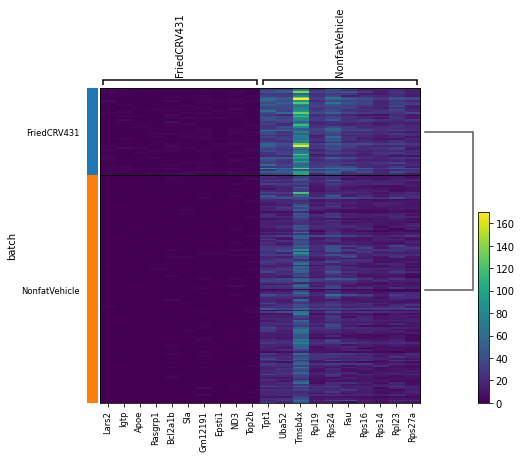

cDC1s
cDC2s
pDCs
pDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9554413542194824


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


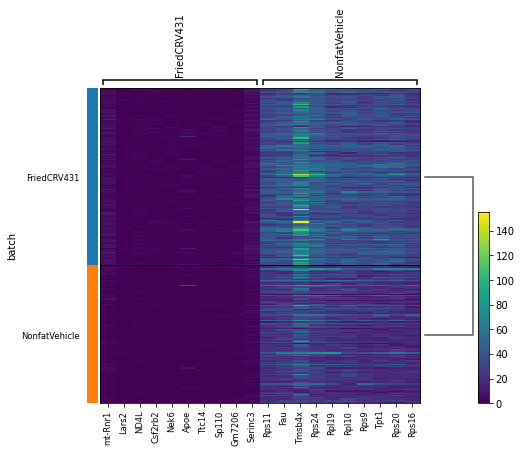

NonfatVehicle x FriedLANI


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


B Cells
B Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9396334515889788


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


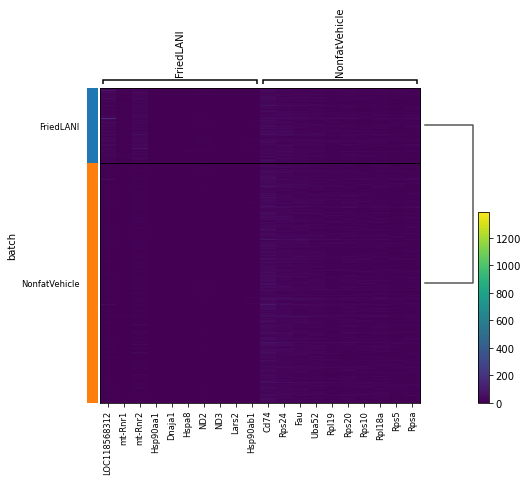

Basophils
Basophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9687819371006371


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


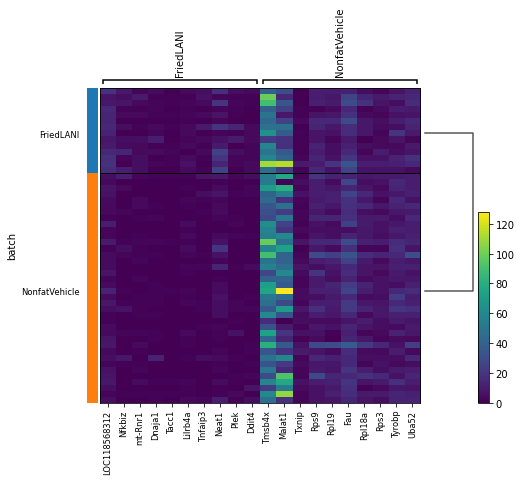

Blood
CTLs
CTLs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9211690056197848


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


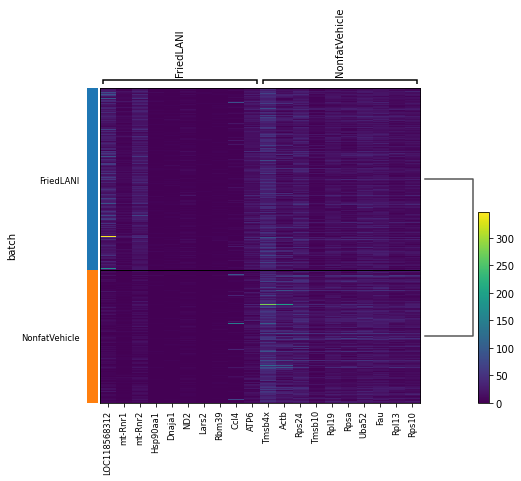

CV & Cap. Macs
Cd79a++
Cholangiocytes
Ebf1++
Emp1++
Endothelial Cells
H2-Ab1++
Hepatocytes
ILC1s
ILC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9609359048059105


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


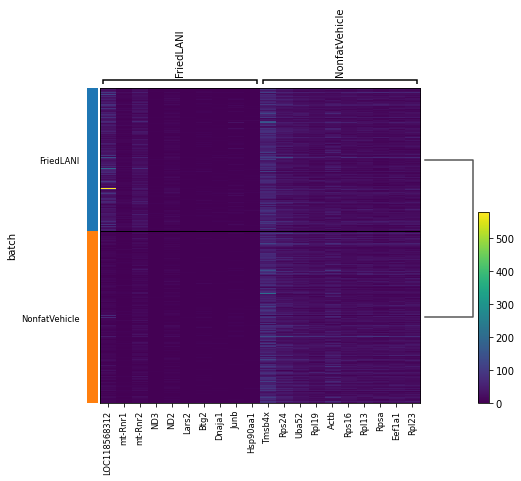

Jchain++
Kupffer Cells
LAMs
Mig. cDCs
Monocytes
Monocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.5516968904518395


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


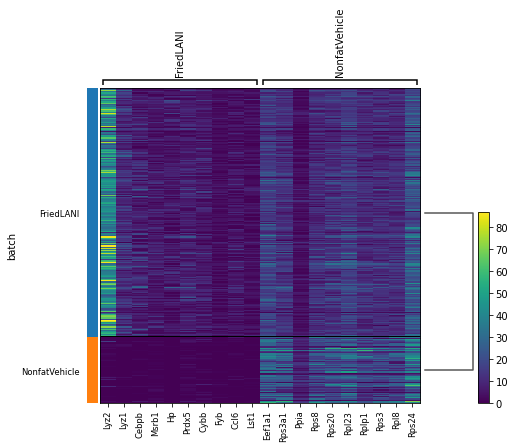

NK Cells
NK Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9616821021765898


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


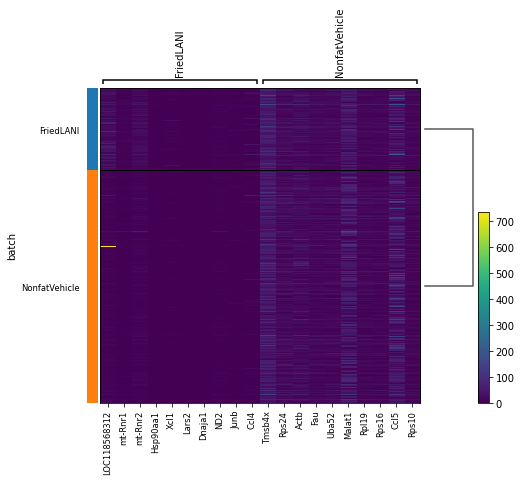

NKT Cells
Naive CD4+
Naive CD4+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9420654856202756


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


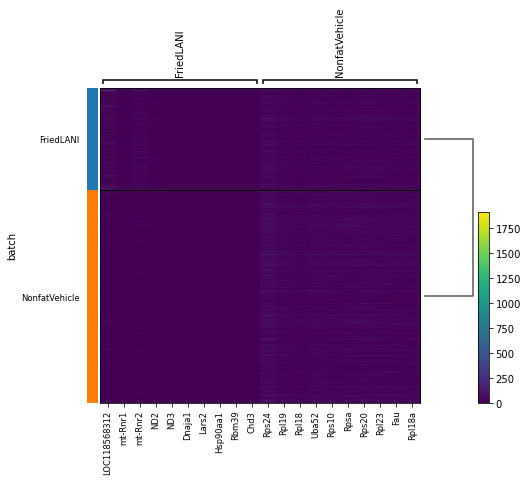

Naive CD8+
Naive CD8+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9325910318150242


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


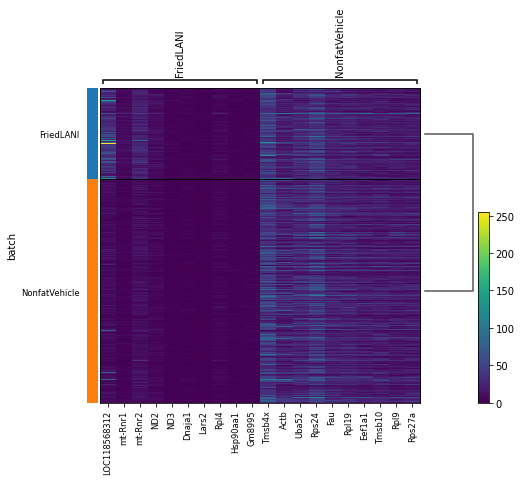

Neutrophils
Neutrophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9129538347678644


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


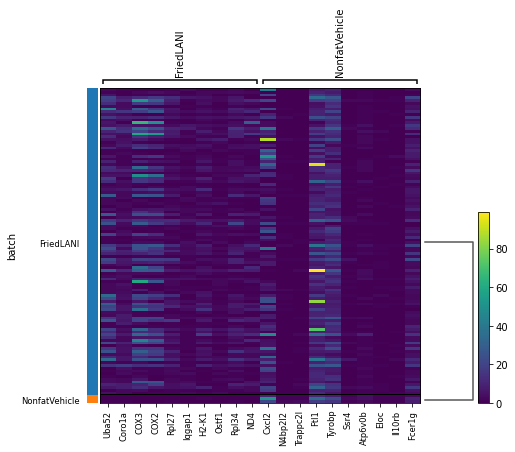

Pat. Mono
Peri. Macs
Peri. Macs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.775524239348455


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


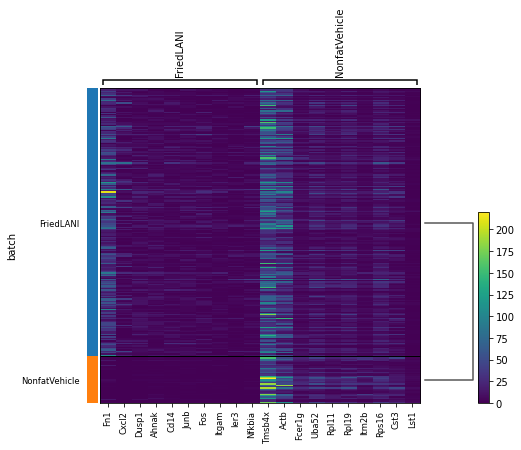

Stellate Cells
Stmn1++
TEM
TRegs
Th1s
Trans. Mono
VSMCs
Y-Delta T Cells
Y-Delta T Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9456221238948261


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


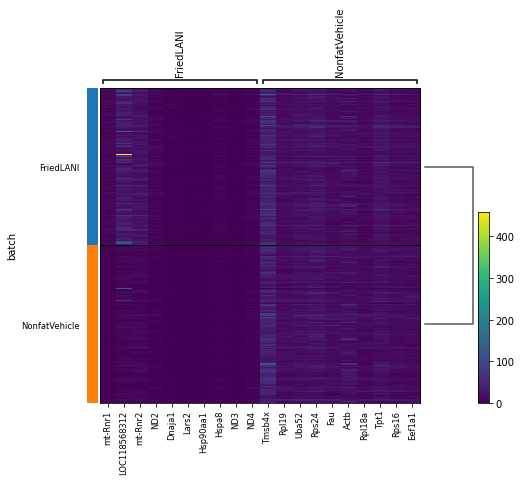

cDC1s
cDC2s
pDCs
pDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9827127219777724


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


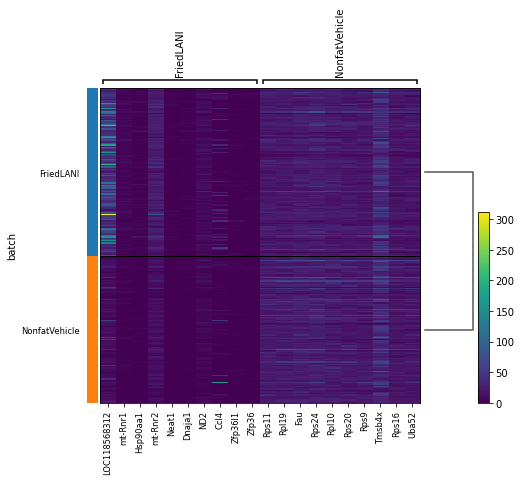

NonfatVehicle x FriedCRVLAN


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


B Cells
B Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.7418841913362259


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


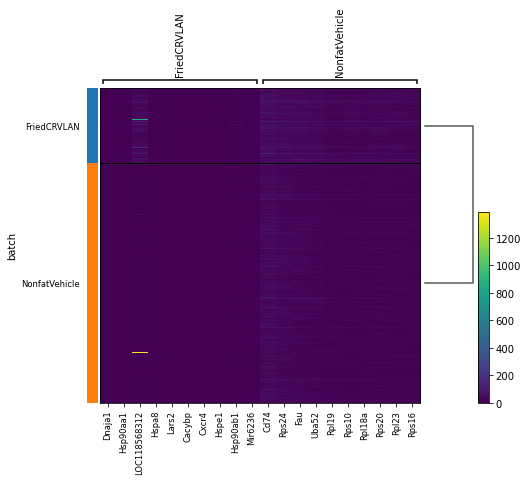

Basophils
Basophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9098242068258483


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


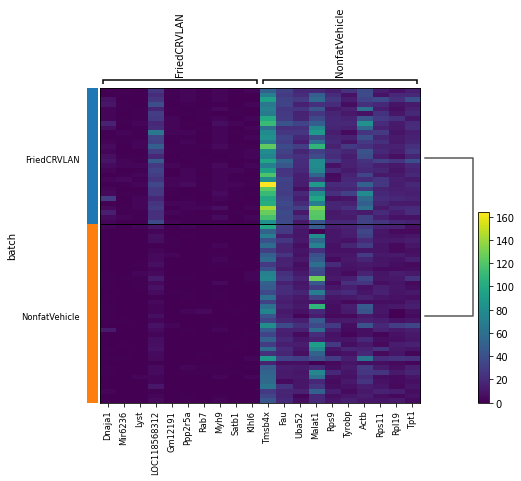

Blood
CTLs
CTLs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.7200809465524252


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


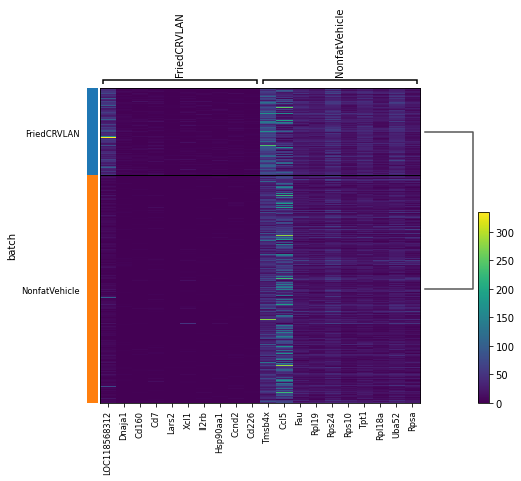

CV & Cap. Macs
Cd79a++
Cholangiocytes
Ebf1++
Emp1++
Endothelial Cells
H2-Ab1++
Hepatocytes
ILC1s
ILC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.8595425079285102


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


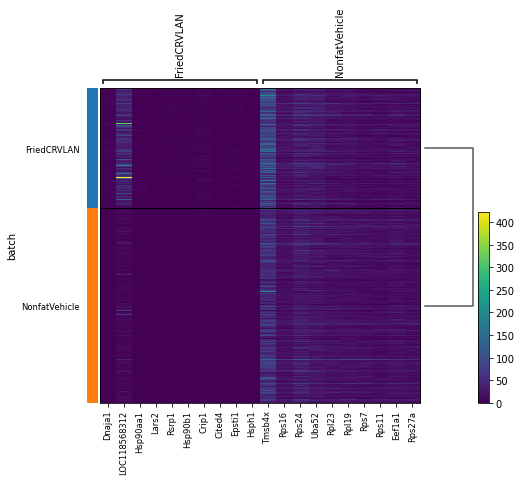

Jchain++
Kupffer Cells
LAMs
Mig. cDCs
Monocytes
Monocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.6335055430961006


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


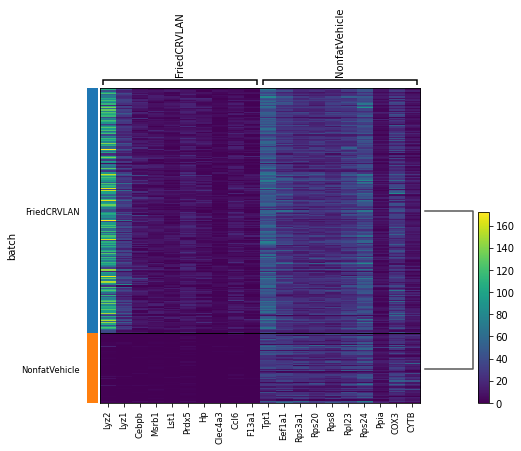

NK Cells
NK Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.8555083389355411


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


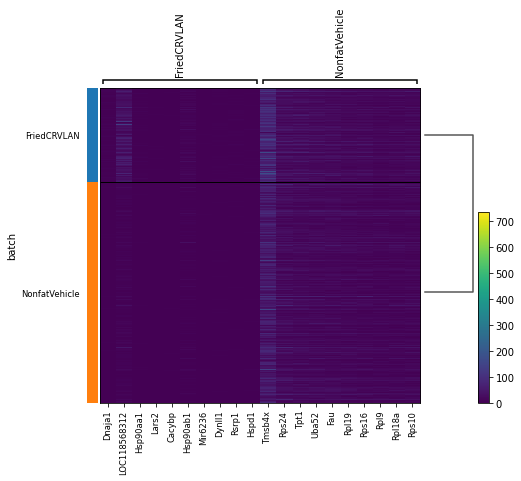

NKT Cells
Naive CD4+
Naive CD4+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.8525470031487216


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


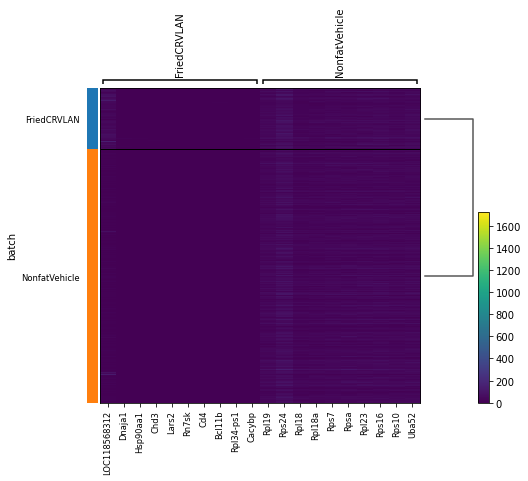

Naive CD8+
Naive CD8+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.7391962116671735


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


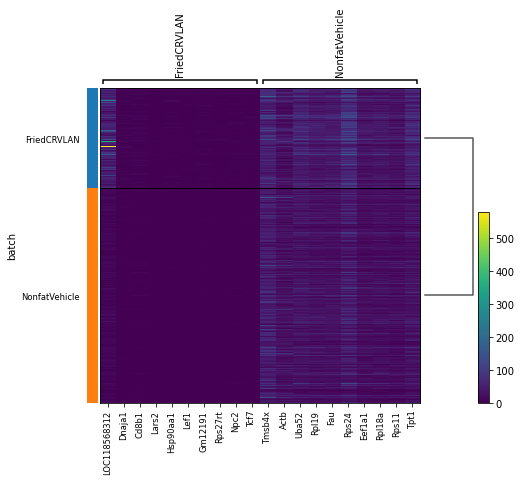

Neutrophils
Neutrophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.8858146517653913


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


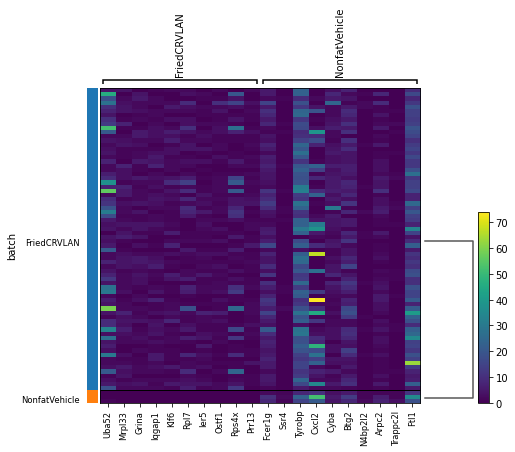

Pat. Mono
Peri. Macs
Stellate Cells
Stmn1++
TEM
TRegs
Th1s
Trans. Mono
VSMCs
Y-Delta T Cells
Y-Delta T Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.6301084997333067


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


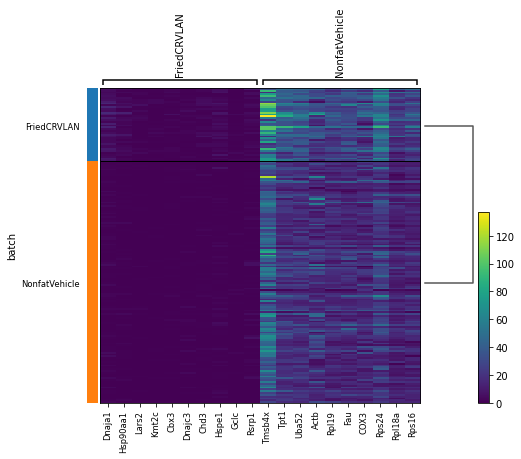

cDC1s
cDC2s
pDCs
pDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9536897154996888


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


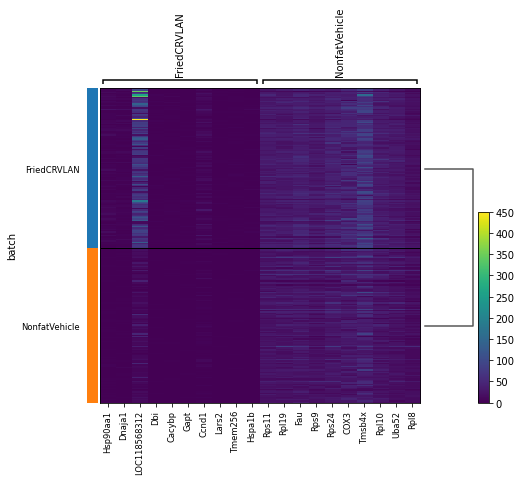

FriedVehicle x FriedCRV431


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


B Cells
B Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9344644150122052


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


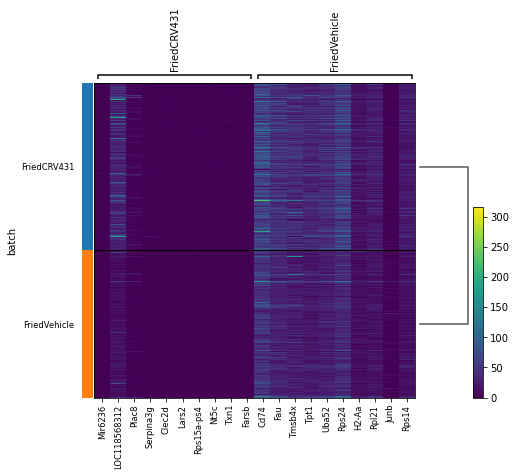

Basophils
Basophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.8861330816573714


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


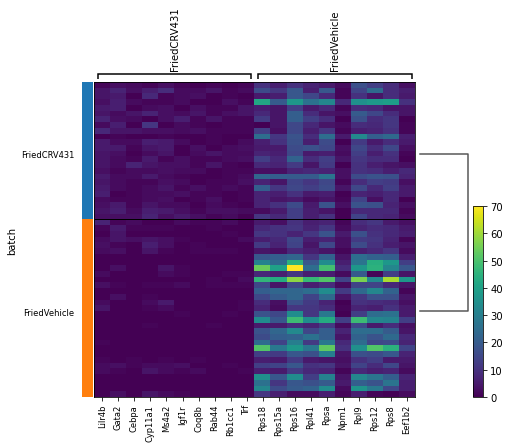

Blood
CTLs
CTLs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.7909052867802121


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


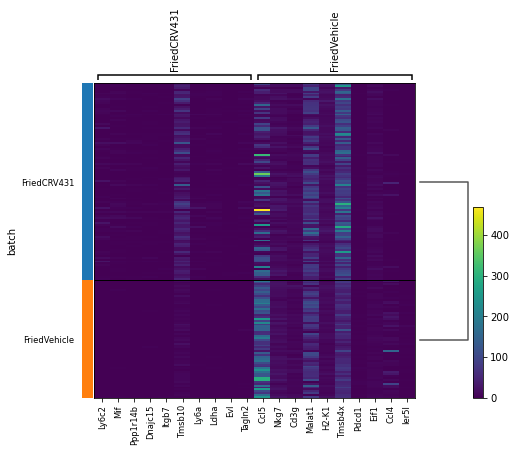

CV & Cap. Macs
CV & Cap. Macs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9323832981854929


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


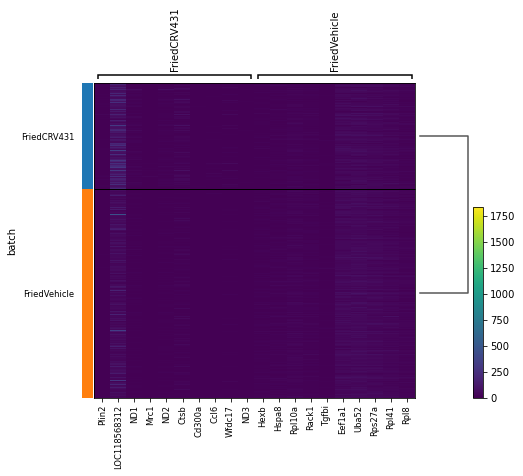

Cd79a++
Cholangiocytes
Cholangiocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9946182359512544


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


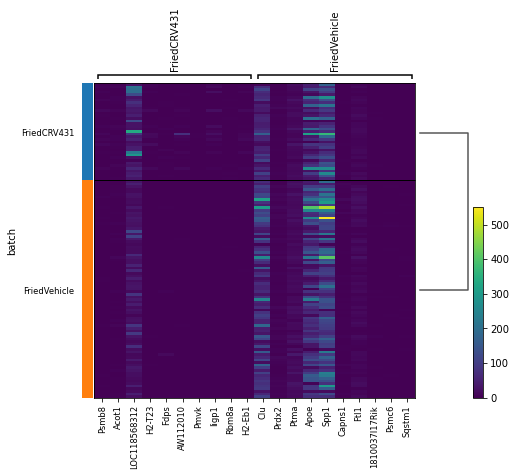

Ebf1++
Emp1++
Endothelial Cells
Endothelial Cells
0.9660903741727013


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


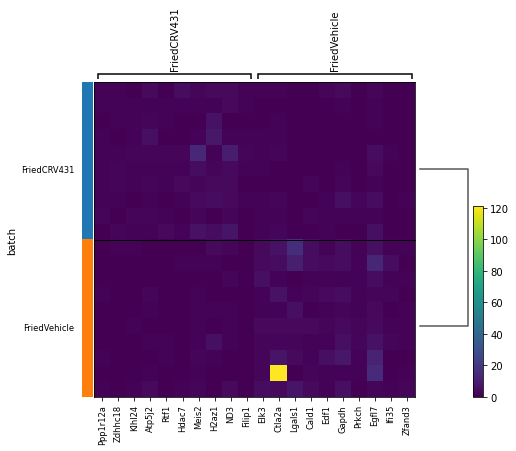

H2-Ab1++
Hepatocytes
ILC1s
ILC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.938654588629732


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


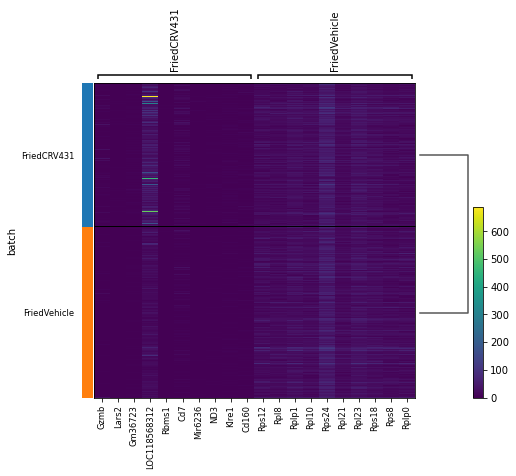

Jchain++
Kupffer Cells
LAMs
LAMs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.6860409264652411


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


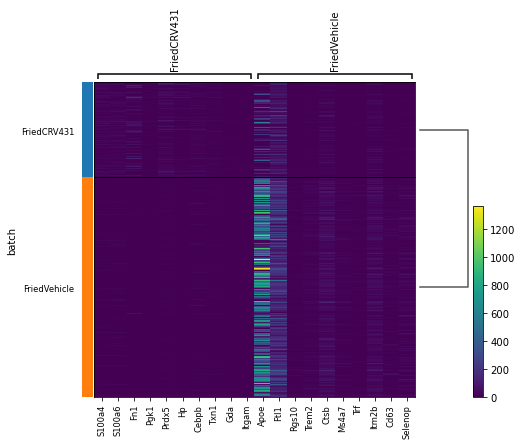

Mig. cDCs
Mig. cDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9482048061029036


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


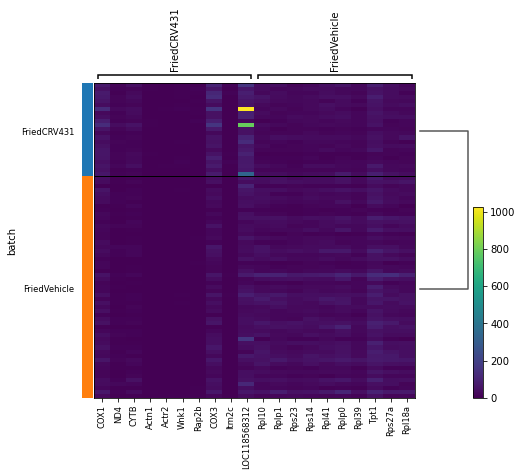

Monocytes
Monocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9477525443268298


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


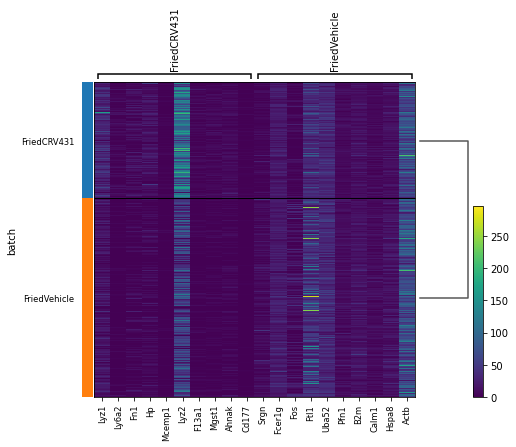

NK Cells
NK Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9391883471680067


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


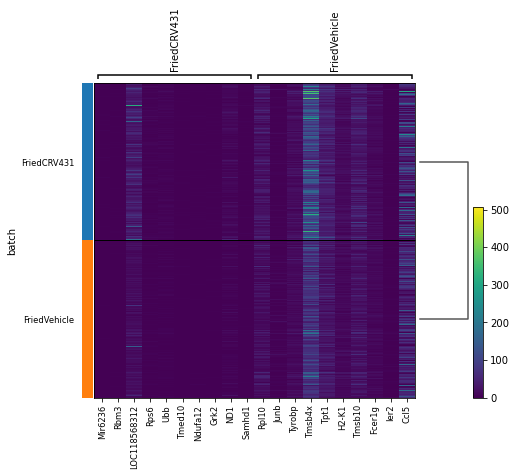

NKT Cells
Naive CD4+
Naive CD4+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9661304056112474


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


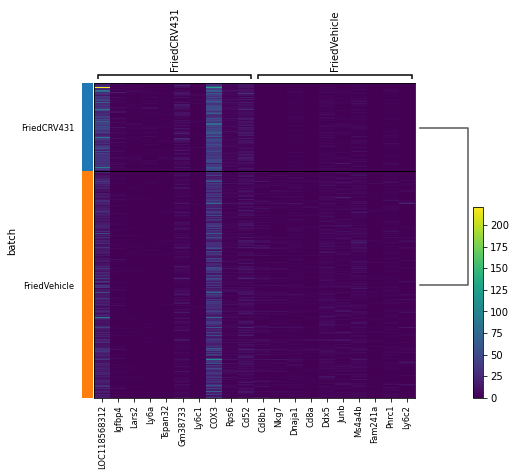

Naive CD8+
Naive CD8+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9088952998400888


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


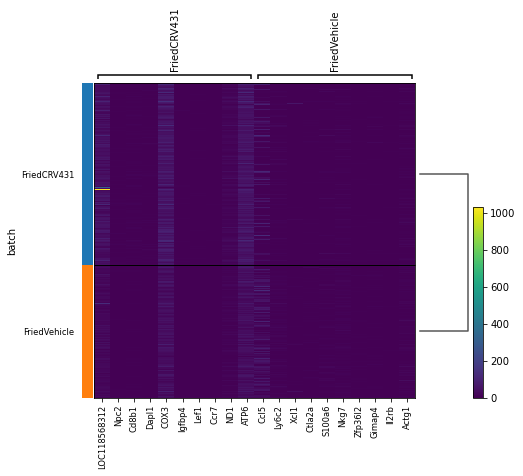

Neutrophils
Neutrophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.8687624580111329


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


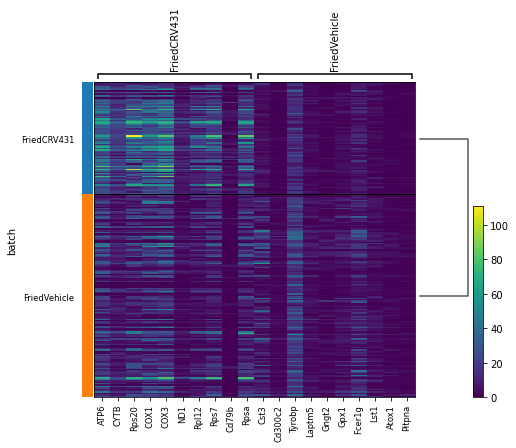

Pat. Mono
Pat. Mono


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.8970336720300098


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


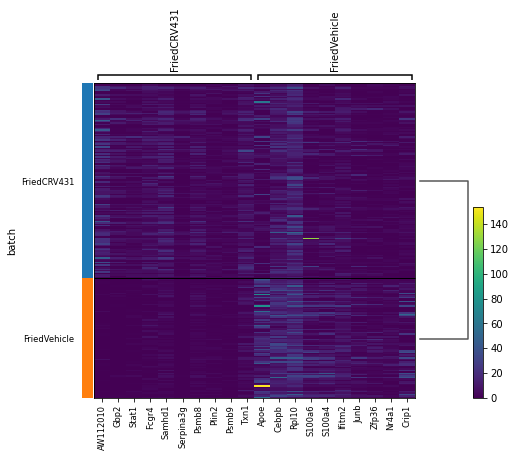

Peri. Macs
Stellate Cells
Stellate Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.970746259013825


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


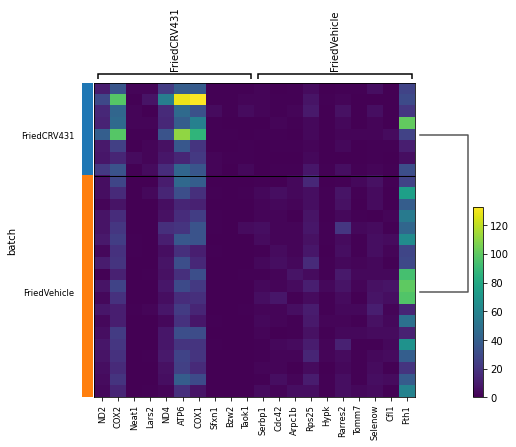

Stmn1++
Stmn1++


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9460441337571498


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


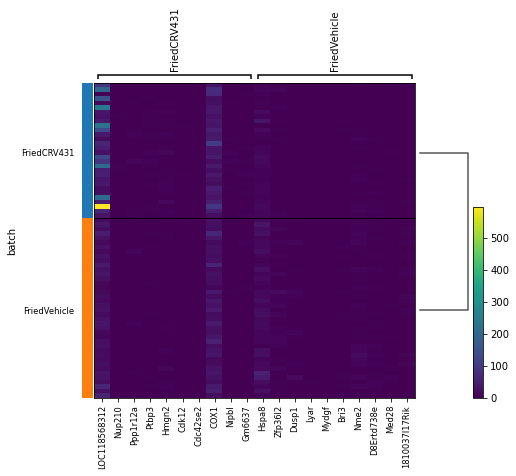

TEM
TRegs
TRegs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9290655278869823


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


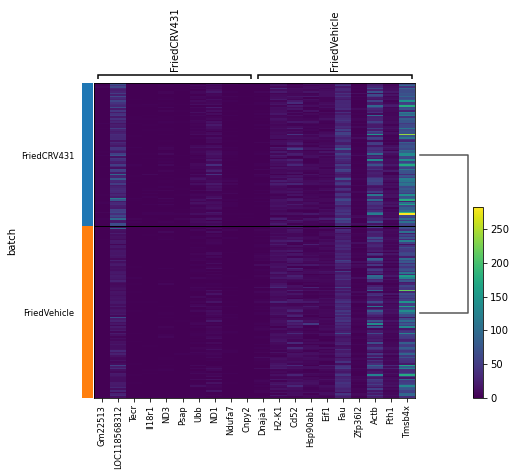

Th1s
Trans. Mono
Trans. Mono


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.739608889327784


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


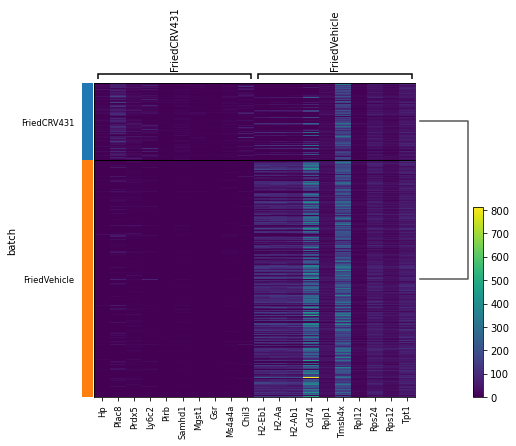

VSMCs
Y-Delta T Cells
Y-Delta T Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9512865411386703


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


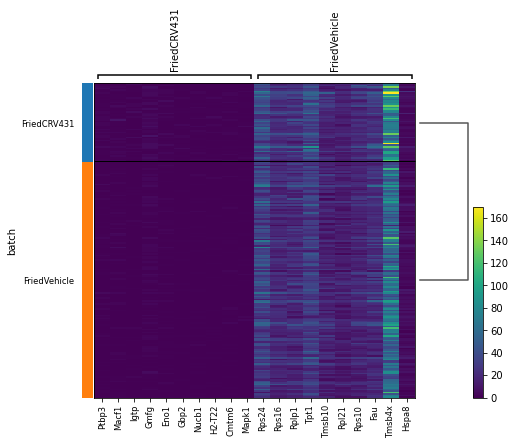

cDC1s
cDC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9831272204580782


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


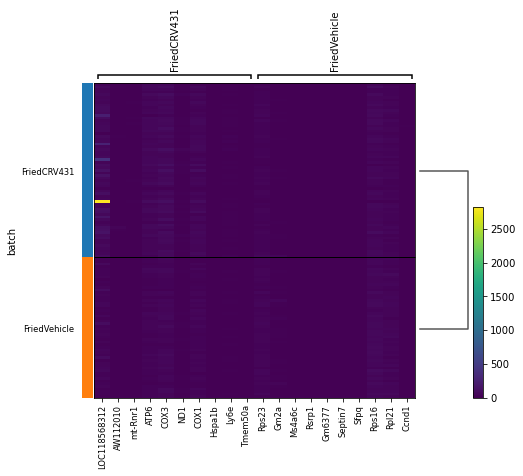

cDC2s
cDC2s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.959907050886638


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


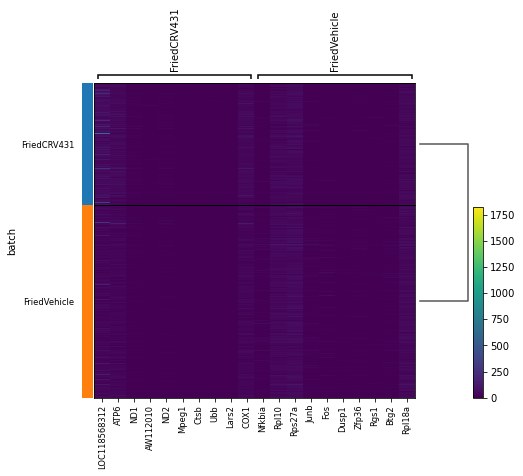

pDCs
pDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.992088539367737


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


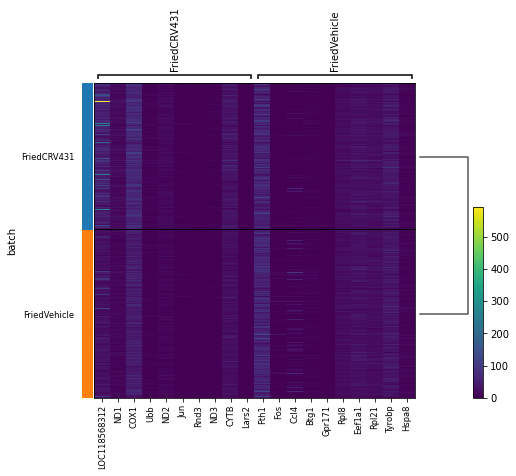

FriedVehicle x FriedLANI


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


B Cells
B Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9082716307440329


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


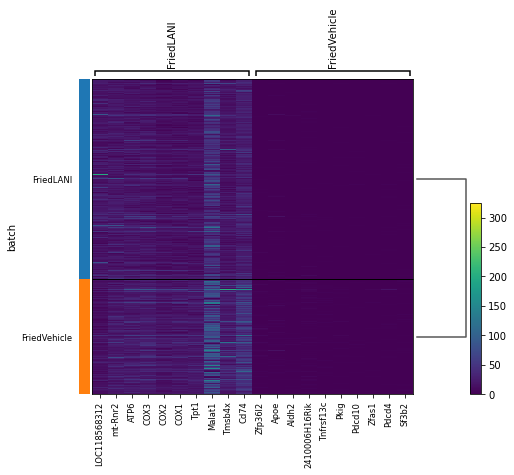

Basophils
Basophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.7679978003062817


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


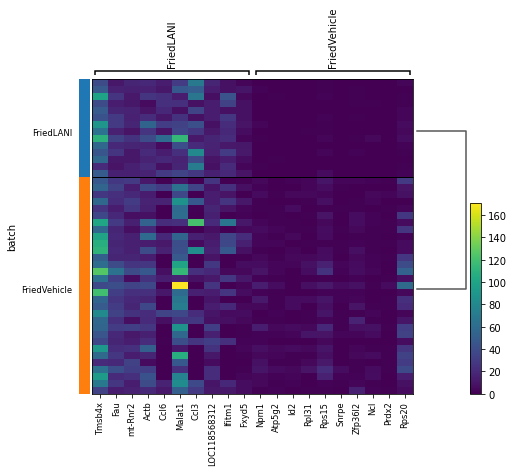

Blood
CTLs
CTLs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9037664412643429


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


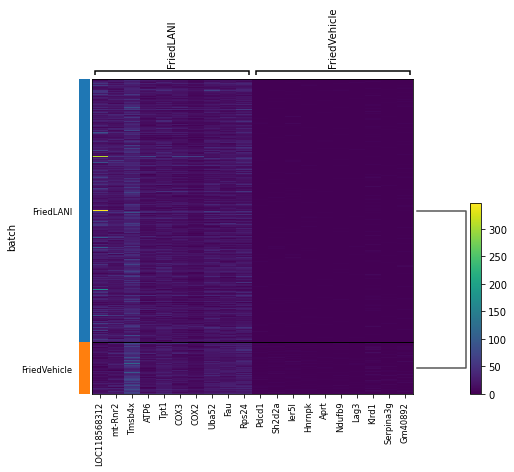

CV & Cap. Macs
CV & Cap. Macs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.8962720286444711


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


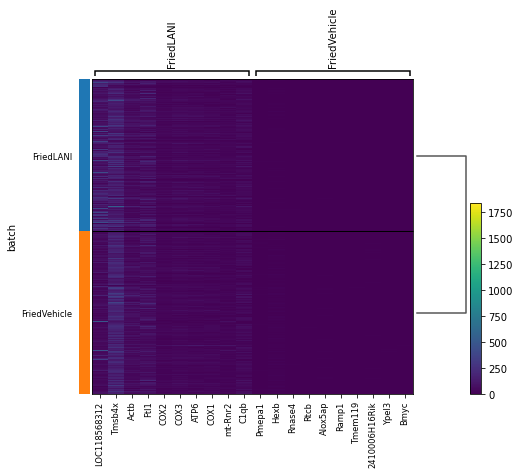

Cd79a++
Cholangiocytes
Cholangiocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9923690481587701


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


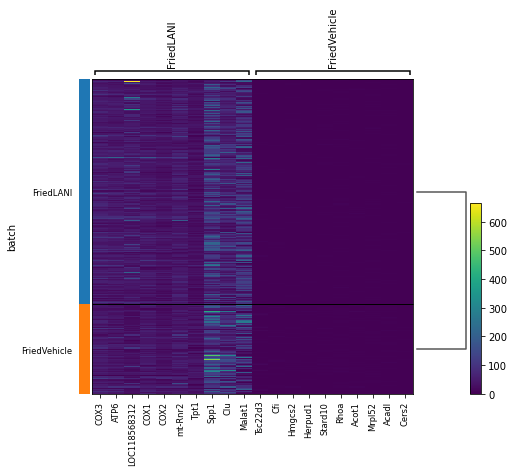

Ebf1++
Emp1++
Endothelial Cells
Endothelial Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9752362631566174


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


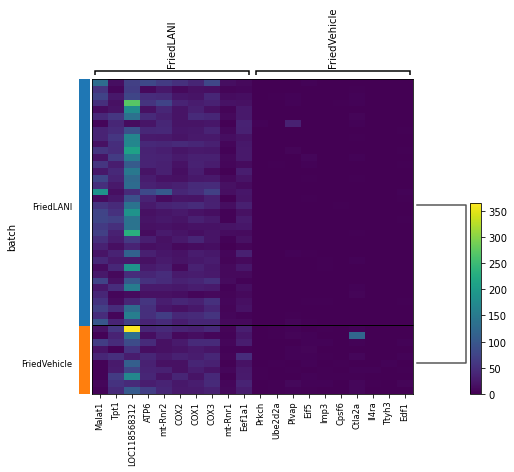

H2-Ab1++
Hepatocytes
Hepatocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9749219178486884


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


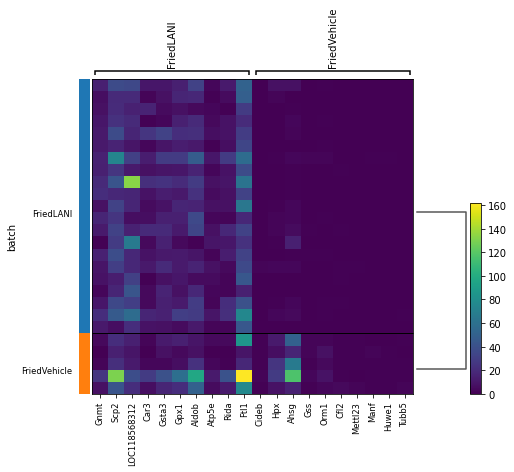

ILC1s
ILC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9228883955014962


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


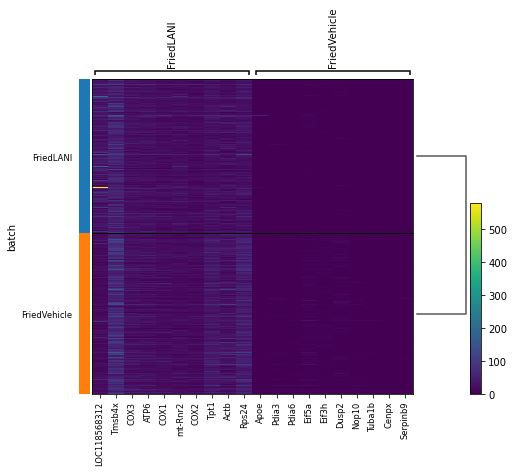

Jchain++
Jchain++


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.908926338957437


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


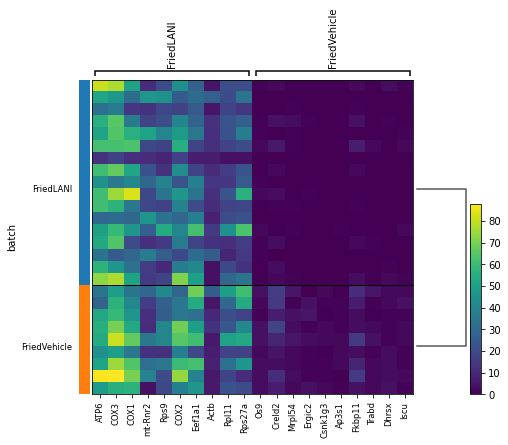

Kupffer Cells
Kupffer Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.805816297107779


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


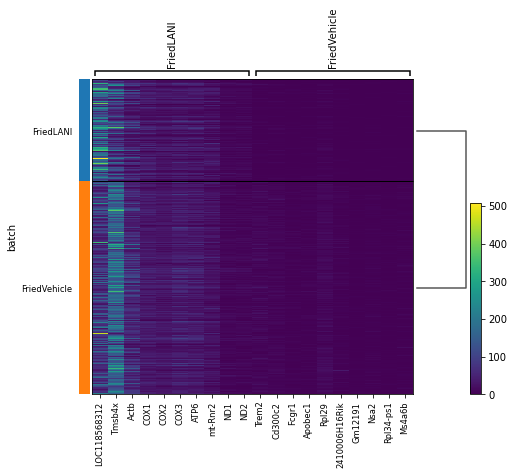

LAMs
LAMs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.8203348788823693


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


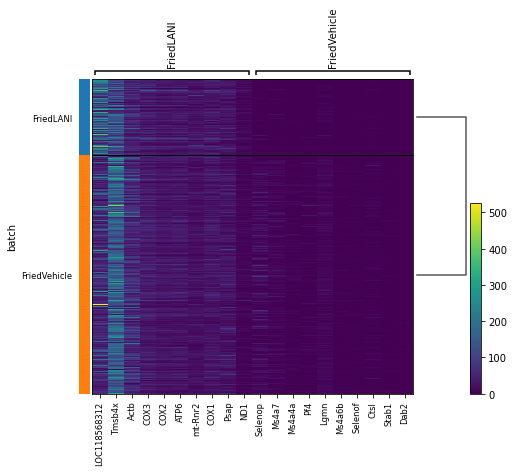

Mig. cDCs
Mig. cDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.8781634080292594


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


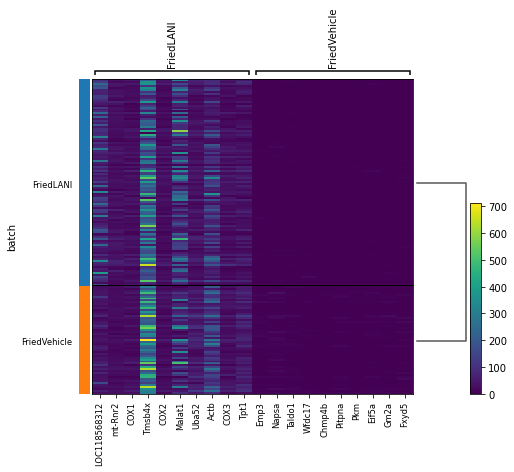

Monocytes
Monocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9229397386156424


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


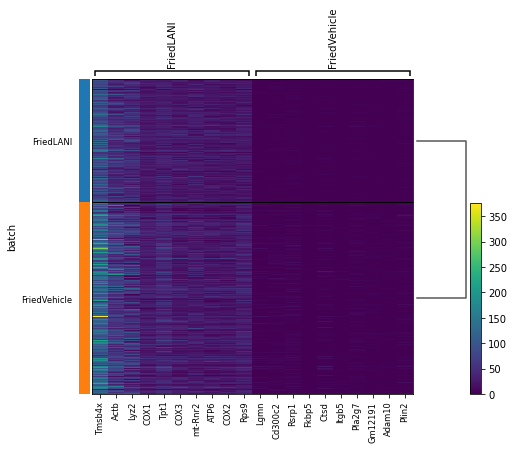

NK Cells
NK Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9230720886195125


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


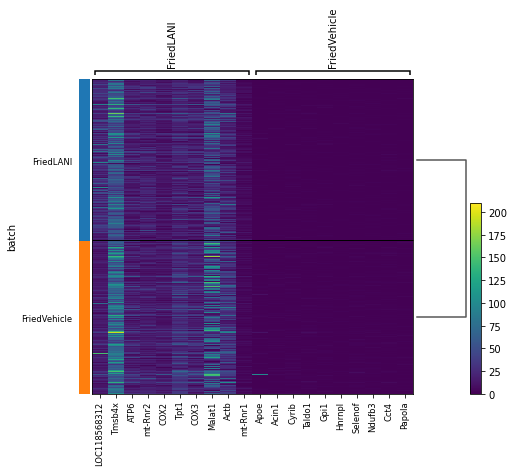

NKT Cells
Naive CD4+
Naive CD4+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9203870668949913


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


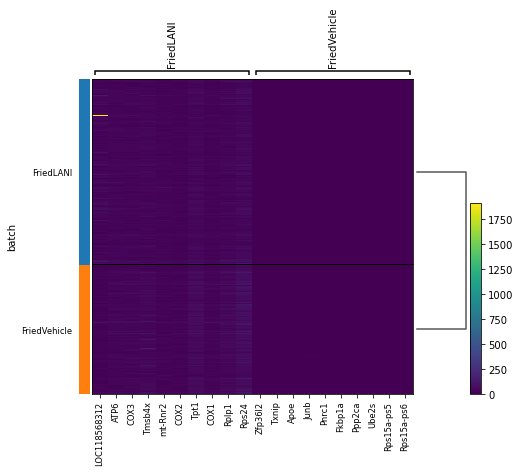

Naive CD8+
Naive CD8+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.8725167772442495


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


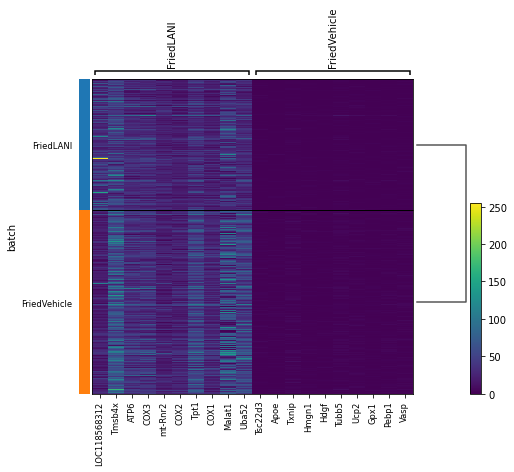

Neutrophils
Neutrophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9143694690889137


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


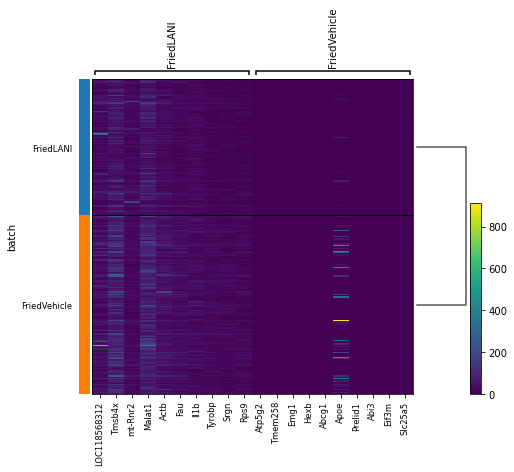

Pat. Mono
Pat. Mono


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.8824951470395368


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


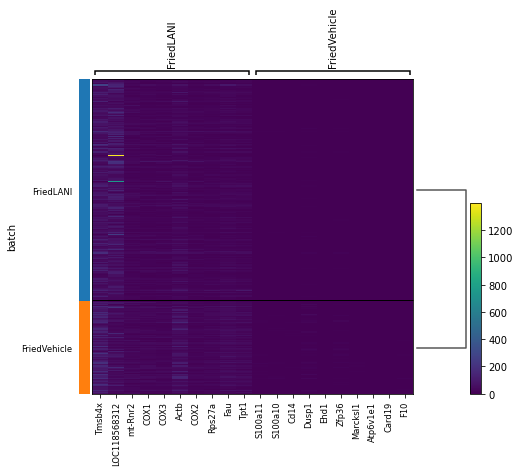

Peri. Macs
Peri. Macs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.8510304404751473


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


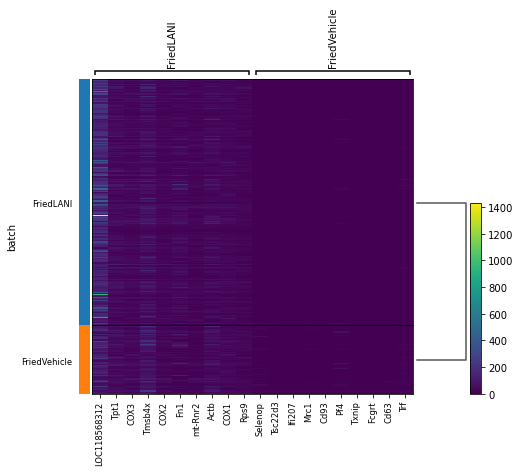

Stellate Cells
Stellate Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.982140180339222


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


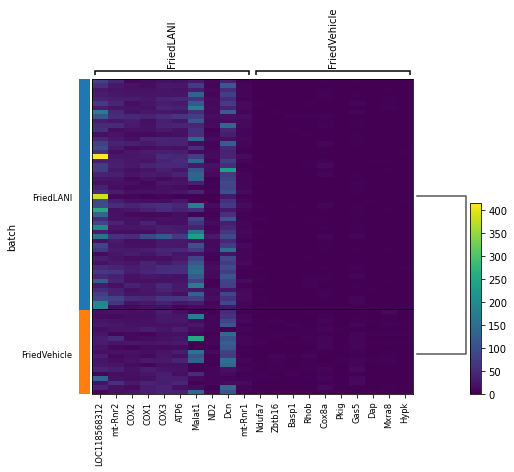

Stmn1++
Stmn1++


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.8722217558825283


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


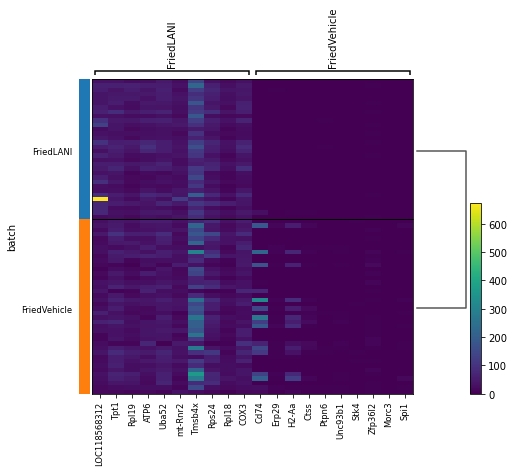

TEM
TRegs
TRegs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.8449322755847369


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


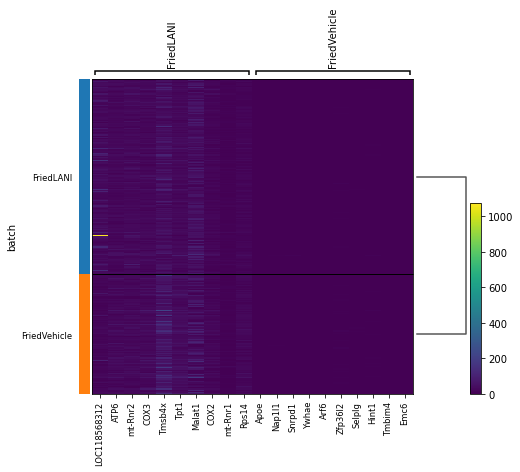

Th1s
Trans. Mono
Trans. Mono


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.8103899069119959


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


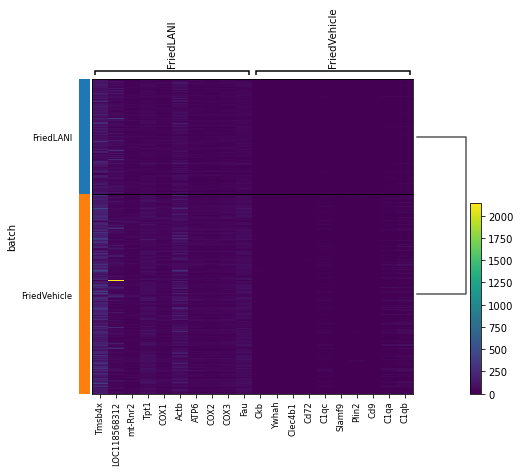

VSMCs
Y-Delta T Cells
Y-Delta T Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.92706460338446


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


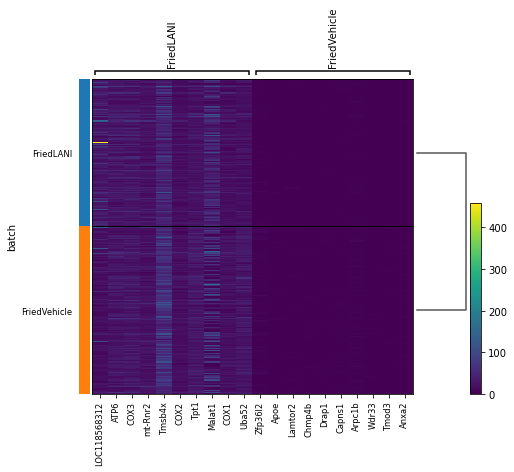

cDC1s
cDC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.933020435370207


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


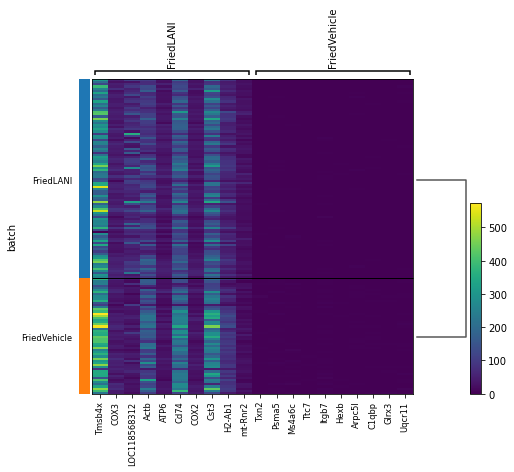

cDC2s
cDC2s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.8853875225055945


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


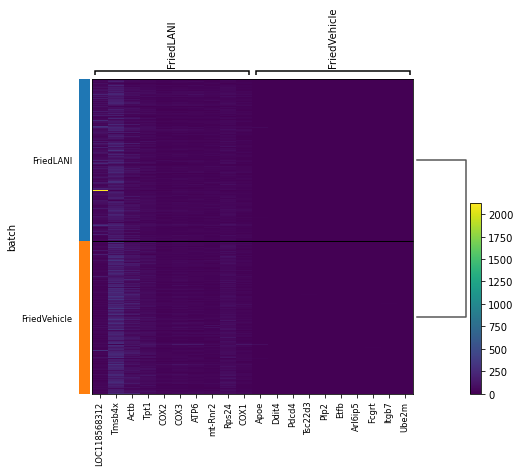

pDCs
pDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


0.9495648560546166


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


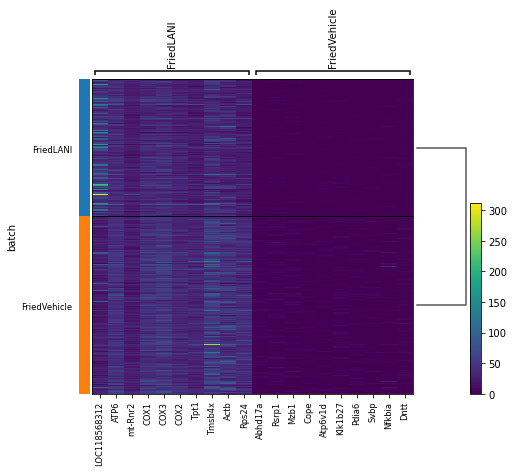

FriedVehicle x FriedCRVLAN


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


KeyboardInterrupt: 

In [18]:
treatment = ['NonfatVehicle', 'FriedVehicle', 'FriedCRV431', 'FriedLANI', 'FriedCRVLAN']
pathPrefix='../clusteringResults/'
'''
mtxPath = "/Volumes/Expansion/Hepion/Data/"
otherData = {}
for i,t in enumerate(treatment):
    Data[t] = input.loadSTAR(f"{mtxPath}{t}/", labels=True, make_unique=False)
    print(otherData[t])
'''
treatmentSimilarityDF = out.rankCellTypes(Data, treatments, silent=False)
treatmentSimilarityDF.to_csv("cluster_similarity_scores.csv")



FriedVehicle x FriedCRV431


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


['B Cells' 'Basophils' 'CTLs' 'CV & Cap. Macs' 'Cd79a++' 'Cholangiocytes'
 'Endothelial Cells' 'ILC1s' 'LAMs' 'Mig. cDCs' 'Mir6236++' 'Monocytes'
 'NK Cells' 'Naive CD4+' 'Naive CD8+' 'Neutrophils' 'Pat. Mono'
 'Peri. Macs' 'Stellate Cells' 'Stmn1++' 'TRegs' 'Trans. Mono'
 'Y-Delta T Cells' 'cDC1s' 'cDC2s' 'pDCs']
['B Cells' 'Basophils' 'CTLs' 'CV & Cap. Macs' 'Cholangiocytes' 'Ebf1++'
 'Emp1++' 'Endothelial Cells' 'Hepatocytes' 'ILC1s' 'Jchain++'
 'Kupffer Cells' 'LAMs' 'Mig. cDCs' 'Monocytes' 'NK Cells' 'Naive CD4+'
 'Naive CD8+' 'Neutrophils' 'Pat. Mono' 'Peri. Macs' 'Stellate Cells'
 'Stmn1++' 'TEM' 'TRegs' 'Trans. Mono' 'Y-Delta T Cells' 'cDC1s' 'cDC2s'
 'pDCs']
B Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


44
9
2
6


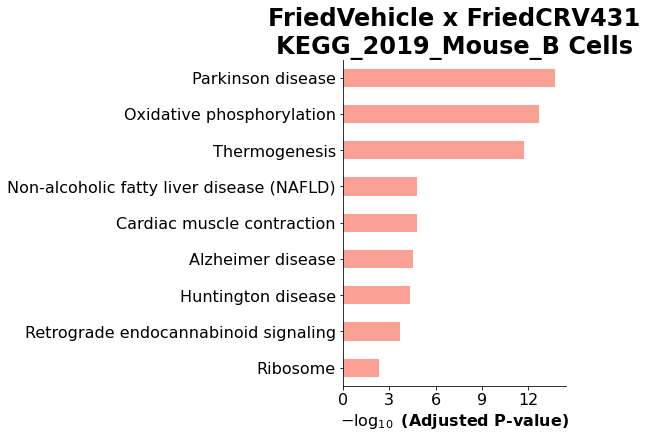

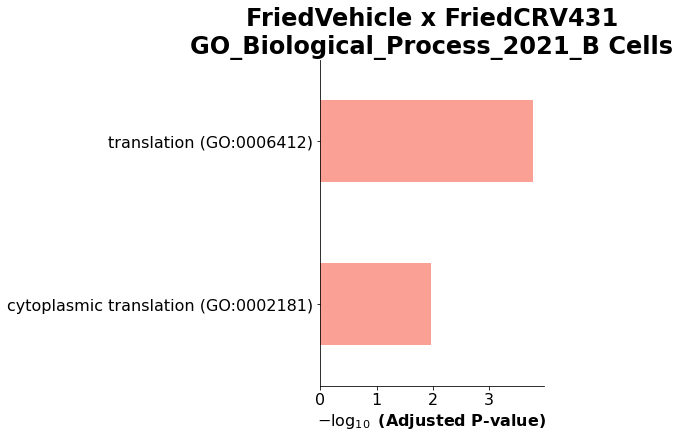

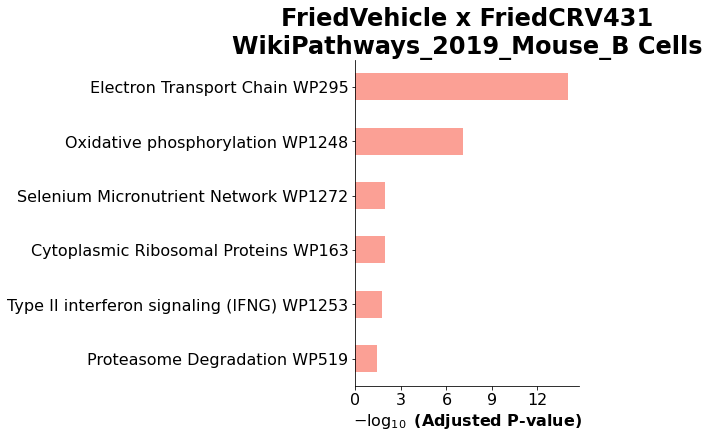

['B Cells' 'Basophils' 'CTLs' 'CV & Cap. Macs' 'Cholangiocytes' 'Ebf1++'
 'Emp1++' 'Endothelial Cells' 'Hepatocytes' 'ILC1s' 'Jchain++'
 'Kupffer Cells' 'LAMs' 'Mig. cDCs' 'Monocytes' 'NK Cells' 'Naive CD4+'
 'Naive CD8+' 'Neutrophils' 'Pat. Mono' 'Peri. Macs' 'Stellate Cells'
 'Stmn1++' 'TEM' 'TRegs' 'Trans. Mono' 'Y-Delta T Cells' 'cDC1s' 'cDC2s'
 'pDCs']
Basophils
No sig. genes
['B Cells' 'Basophils' 'CTLs' 'CV & Cap. Macs' 'Cholangiocytes' 'Ebf1++'
 'Emp1++' 'Endothelial Cells' 'Hepatocytes' 'ILC1s' 'Jchain++'
 'Kupffer Cells' 'LAMs' 'Mig. cDCs' 'Monocytes' 'NK Cells' 'Naive CD4+'
 'Naive CD8+' 'Neutrophils' 'Pat. Mono' 'Peri. Macs' 'Stellate Cells'
 'Stmn1++' 'TEM' 'TRegs' 'Trans. Mono' 'Y-Delta T Cells' 'cDC1s' 'cDC2s'
 'pDCs']
CTLs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


48
9
27
5


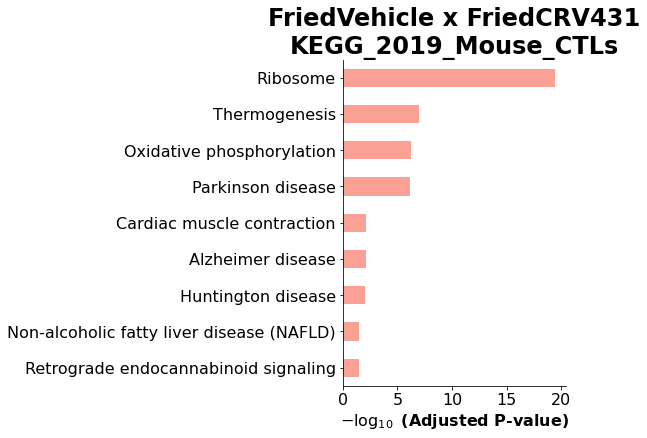

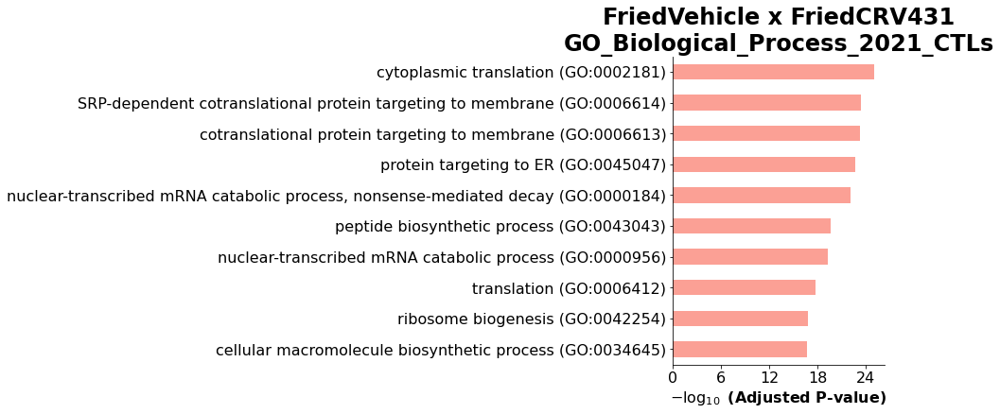

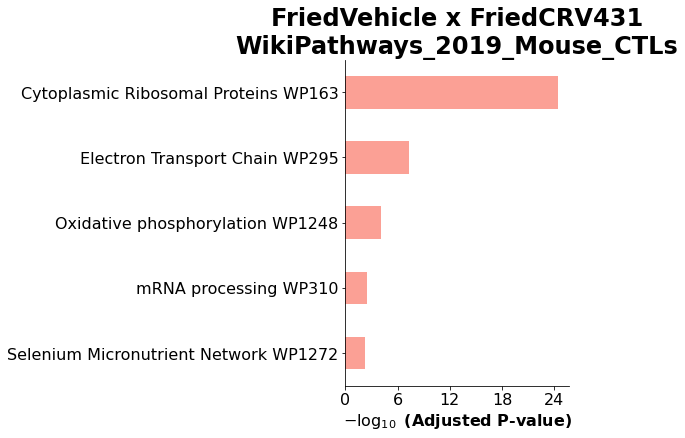

['B Cells' 'Basophils' 'CTLs' 'CV & Cap. Macs' 'Cholangiocytes' 'Ebf1++'
 'Emp1++' 'Endothelial Cells' 'Hepatocytes' 'ILC1s' 'Jchain++'
 'Kupffer Cells' 'LAMs' 'Mig. cDCs' 'Monocytes' 'NK Cells' 'Naive CD4+'
 'Naive CD8+' 'Neutrophils' 'Pat. Mono' 'Peri. Macs' 'Stellate Cells'
 'Stmn1++' 'TEM' 'TRegs' 'Trans. Mono' 'Y-Delta T Cells' 'cDC1s' 'cDC2s'
 'pDCs']
CV & Cap. Macs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


78
17
132
8


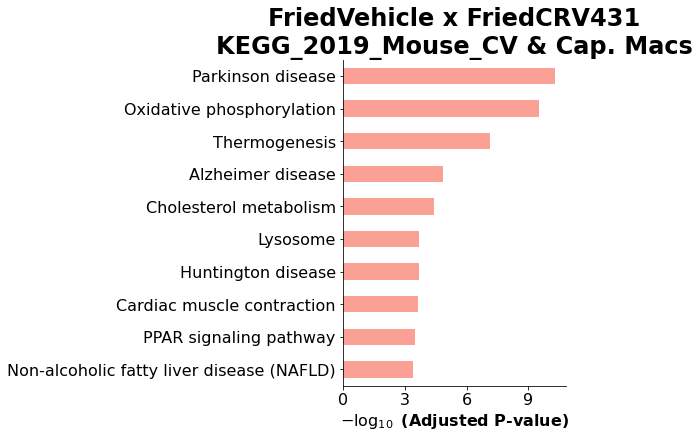

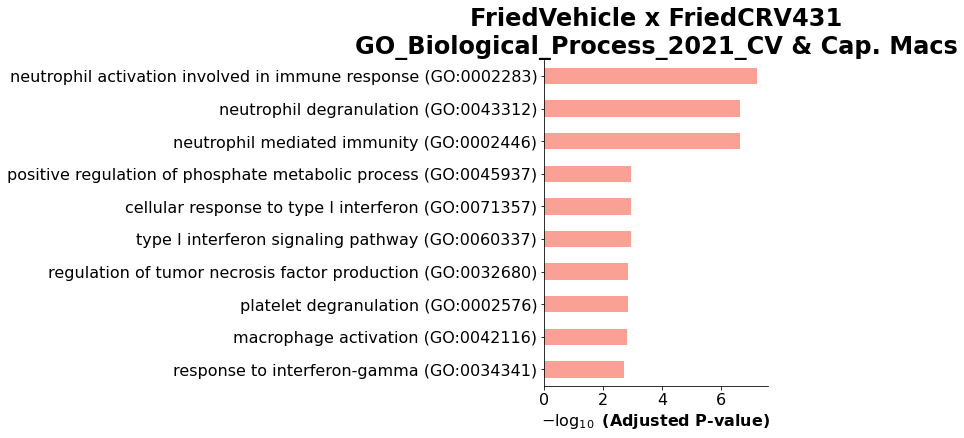

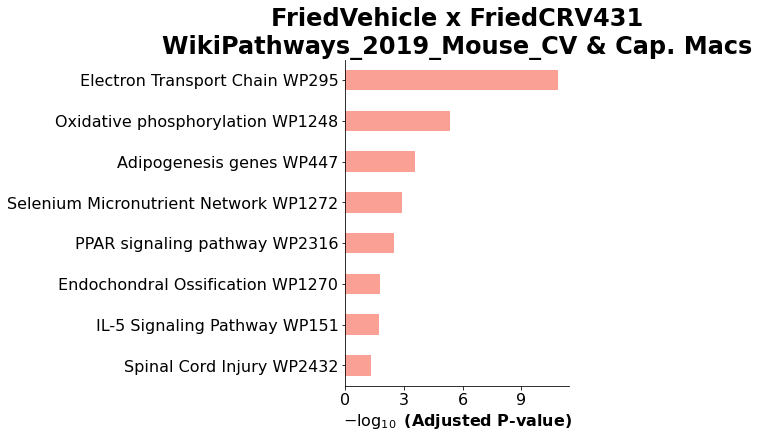

['B Cells' 'Basophils' 'CTLs' 'CV & Cap. Macs' 'Cholangiocytes' 'Ebf1++'
 'Emp1++' 'Endothelial Cells' 'Hepatocytes' 'ILC1s' 'Jchain++'
 'Kupffer Cells' 'LAMs' 'Mig. cDCs' 'Monocytes' 'NK Cells' 'Naive CD4+'
 'Naive CD8+' 'Neutrophils' 'Pat. Mono' 'Peri. Macs' 'Stellate Cells'
 'Stmn1++' 'TEM' 'TRegs' 'Trans. Mono' 'Y-Delta T Cells' 'cDC1s' 'cDC2s'
 'pDCs']
['B Cells' 'Basophils' 'CTLs' 'CV & Cap. Macs' 'Cholangiocytes' 'Ebf1++'
 'Emp1++' 'Endothelial Cells' 'Hepatocytes' 'ILC1s' 'Jchain++'
 'Kupffer Cells' 'LAMs' 'Mig. cDCs' 'Monocytes' 'NK Cells' 'Naive CD4+'
 'Naive CD8+' 'Neutrophils' 'Pat. Mono' 'Peri. Macs' 'Stellate Cells'
 'Stmn1++' 'TEM' 'TRegs' 'Trans. Mono' 'Y-Delta T Cells' 'cDC1s' 'cDC2s'
 'pDCs']
Cholangiocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


No sig. genes
['B Cells' 'Basophils' 'CTLs' 'CV & Cap. Macs' 'Cholangiocytes' 'Ebf1++'
 'Emp1++' 'Endothelial Cells' 'Hepatocytes' 'ILC1s' 'Jchain++'
 'Kupffer Cells' 'LAMs' 'Mig. cDCs' 'Monocytes' 'NK Cells' 'Naive CD4+'
 'Naive CD8+' 'Neutrophils' 'Pat. Mono' 'Peri. Macs' 'Stellate Cells'
 'Stmn1++' 'TEM' 'TRegs' 'Trans. Mono' 'Y-Delta T Cells' 'cDC1s' 'cDC2s'
 'pDCs']
Endothelial Cells
No sig. genes
['B Cells' 'Basophils' 'CTLs' 'CV & Cap. Macs' 'Cholangiocytes' 'Ebf1++'
 'Emp1++' 'Endothelial Cells' 'Hepatocytes' 'ILC1s' 'Jchain++'
 'Kupffer Cells' 'LAMs' 'Mig. cDCs' 'Monocytes' 'NK Cells' 'Naive CD4+'
 'Naive CD8+' 'Neutrophils' 'Pat. Mono' 'Peri. Macs' 'Stellate Cells'
 'Stmn1++' 'TEM' 'TRegs' 'Trans. Mono' 'Y-Delta T Cells' 'cDC1s' 'cDC2s'
 'pDCs']
ILC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


22
8
No Significant Stuffs
3


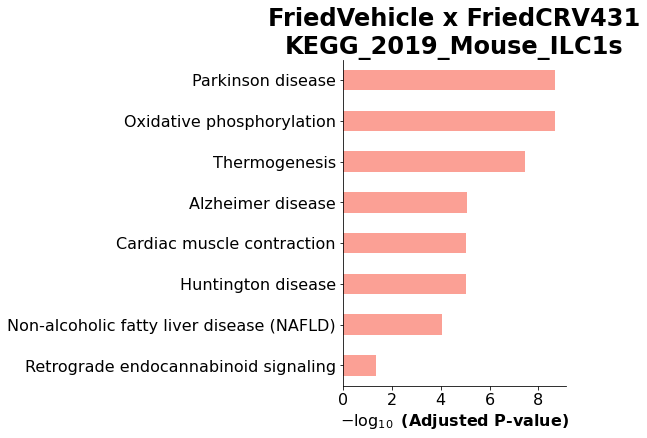

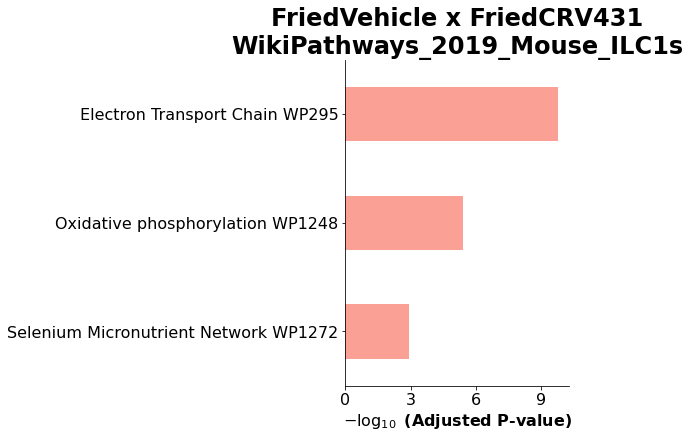

['B Cells' 'Basophils' 'CTLs' 'CV & Cap. Macs' 'Cholangiocytes' 'Ebf1++'
 'Emp1++' 'Endothelial Cells' 'Hepatocytes' 'ILC1s' 'Jchain++'
 'Kupffer Cells' 'LAMs' 'Mig. cDCs' 'Monocytes' 'NK Cells' 'Naive CD4+'
 'Naive CD8+' 'Neutrophils' 'Pat. Mono' 'Peri. Macs' 'Stellate Cells'
 'Stmn1++' 'TEM' 'TRegs' 'Trans. Mono' 'Y-Delta T Cells' 'cDC1s' 'cDC2s'
 'pDCs']
LAMs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


148
18
135
13


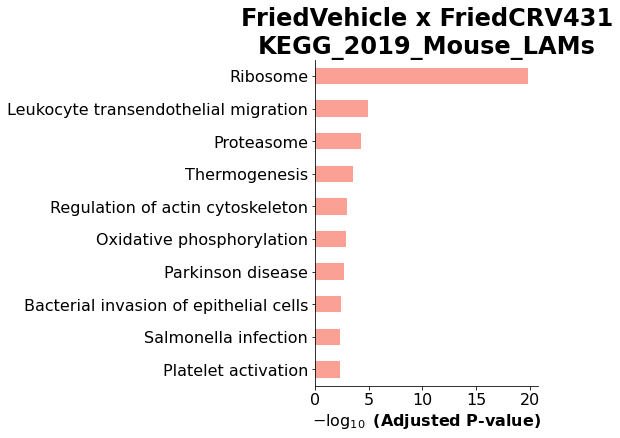

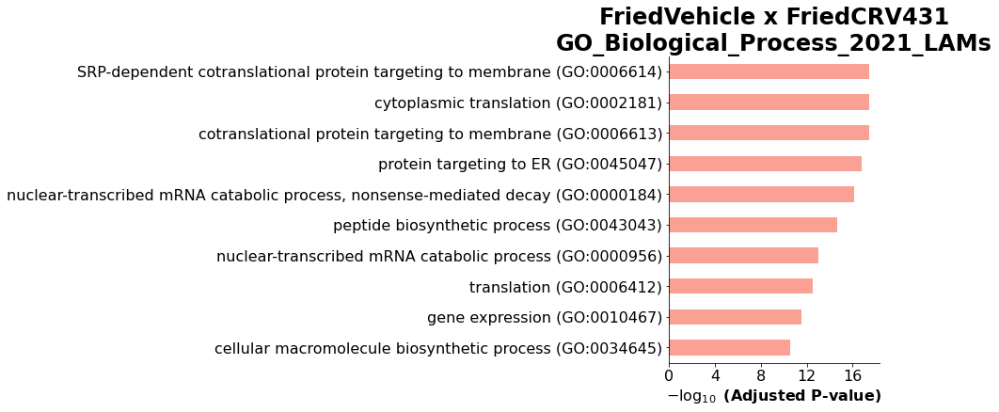

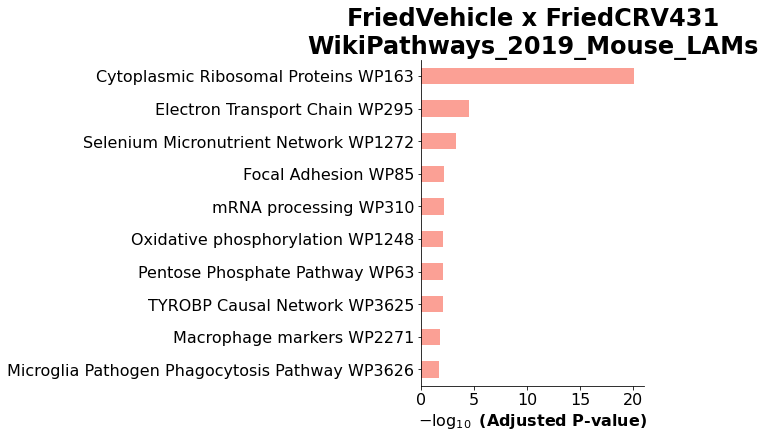

['B Cells' 'Basophils' 'CTLs' 'CV & Cap. Macs' 'Cholangiocytes' 'Ebf1++'
 'Emp1++' 'Endothelial Cells' 'Hepatocytes' 'ILC1s' 'Jchain++'
 'Kupffer Cells' 'LAMs' 'Mig. cDCs' 'Monocytes' 'NK Cells' 'Naive CD4+'
 'Naive CD8+' 'Neutrophils' 'Pat. Mono' 'Peri. Macs' 'Stellate Cells'
 'Stmn1++' 'TEM' 'TRegs' 'Trans. Mono' 'Y-Delta T Cells' 'cDC1s' 'cDC2s'
 'pDCs']
Mig. cDCs
3


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


7
No Significant Stuffs
2


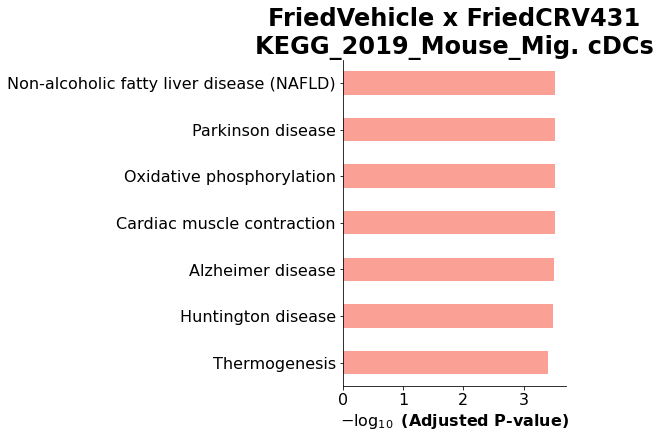

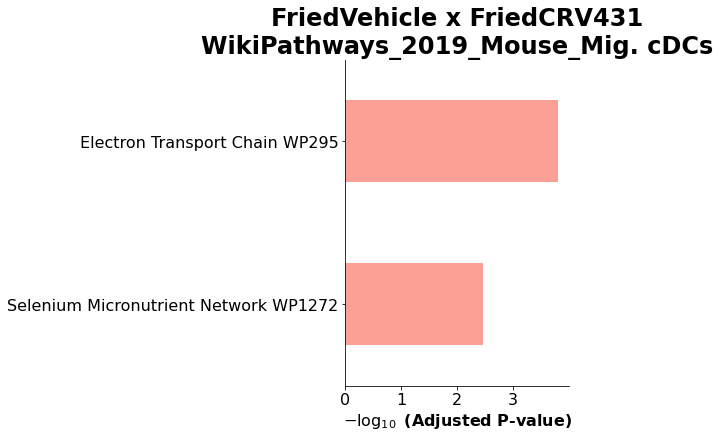

['B Cells' 'Basophils' 'CTLs' 'CV & Cap. Macs' 'Cholangiocytes' 'Ebf1++'
 'Emp1++' 'Endothelial Cells' 'Hepatocytes' 'ILC1s' 'Jchain++'
 'Kupffer Cells' 'LAMs' 'Mig. cDCs' 'Monocytes' 'NK Cells' 'Naive CD4+'
 'Naive CD8+' 'Neutrophils' 'Pat. Mono' 'Peri. Macs' 'Stellate Cells'
 'Stmn1++' 'TEM' 'TRegs' 'Trans. Mono' 'Y-Delta T Cells' 'cDC1s' 'cDC2s'
 'pDCs']
['B Cells' 'Basophils' 'CTLs' 'CV & Cap. Macs' 'Cholangiocytes' 'Ebf1++'
 'Emp1++' 'Endothelial Cells' 'Hepatocytes' 'ILC1s' 'Jchain++'
 'Kupffer Cells' 'LAMs' 'Mig. cDCs' 'Monocytes' 'NK Cells' 'Naive CD4+'
 'Naive CD8+' 'Neutrophils' 'Pat. Mono' 'Peri. Macs' 'Stellate Cells'
 'Stmn1++' 'TEM' 'TRegs' 'Trans. Mono' 'Y-Delta T Cells' 'cDC1s' 'cDC2s'
 'pDCs']
Monocytes


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


90
5
8
10


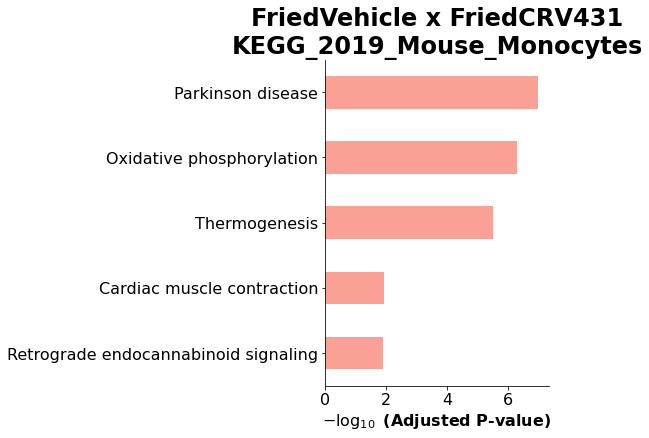

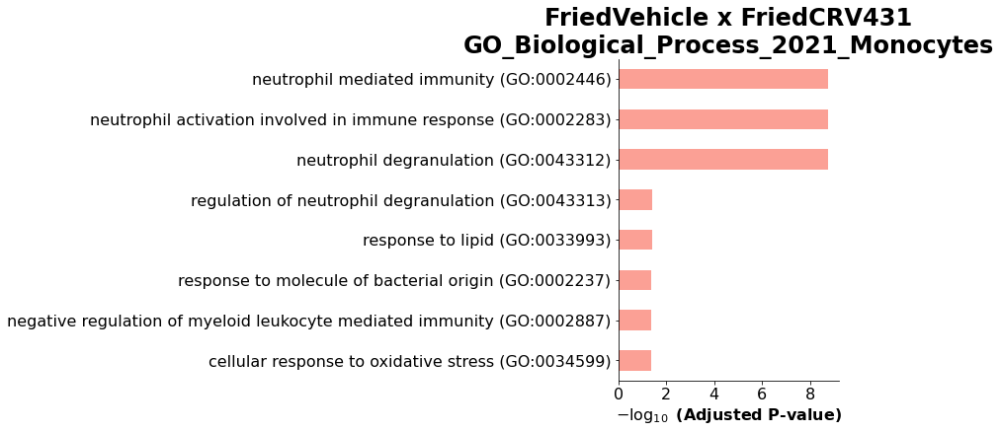

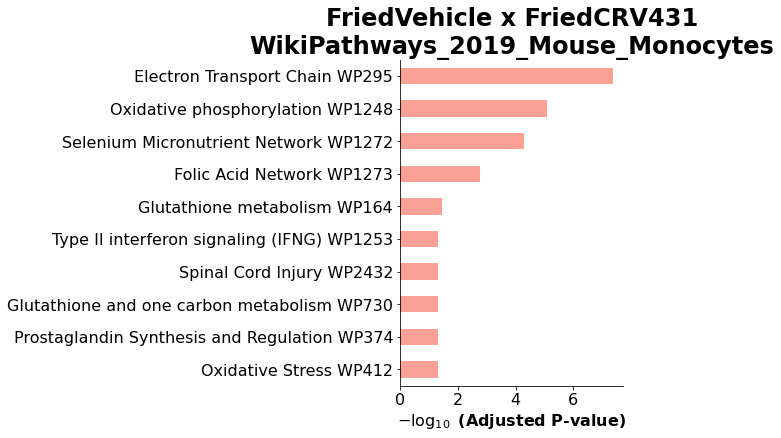

['B Cells' 'Basophils' 'CTLs' 'CV & Cap. Macs' 'Cholangiocytes' 'Ebf1++'
 'Emp1++' 'Endothelial Cells' 'Hepatocytes' 'ILC1s' 'Jchain++'
 'Kupffer Cells' 'LAMs' 'Mig. cDCs' 'Monocytes' 'NK Cells' 'Naive CD4+'
 'Naive CD8+' 'Neutrophils' 'Pat. Mono' 'Peri. Macs' 'Stellate Cells'
 'Stmn1++' 'TEM' 'TRegs' 'Trans. Mono' 'Y-Delta T Cells' 'cDC1s' 'cDC2s'
 'pDCs']
NK Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


7
8
43
6


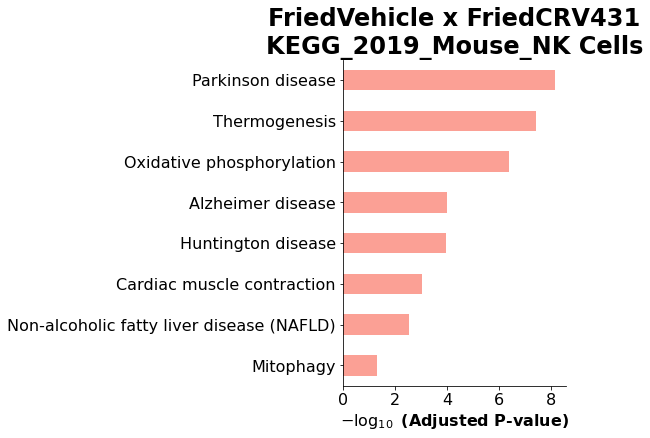

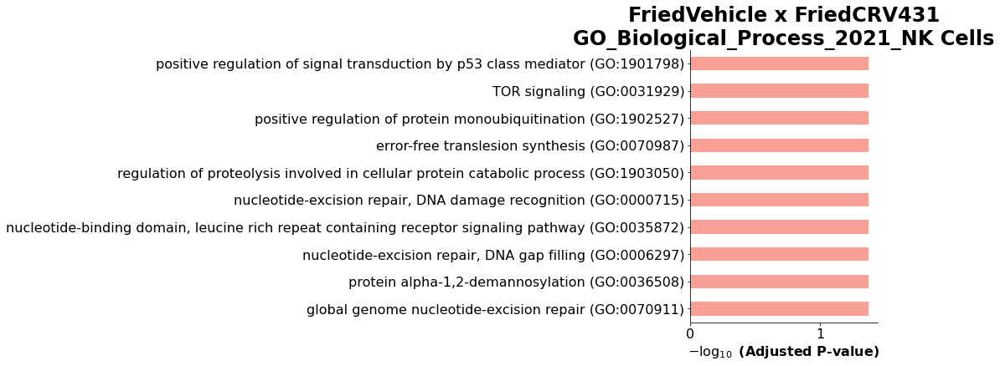

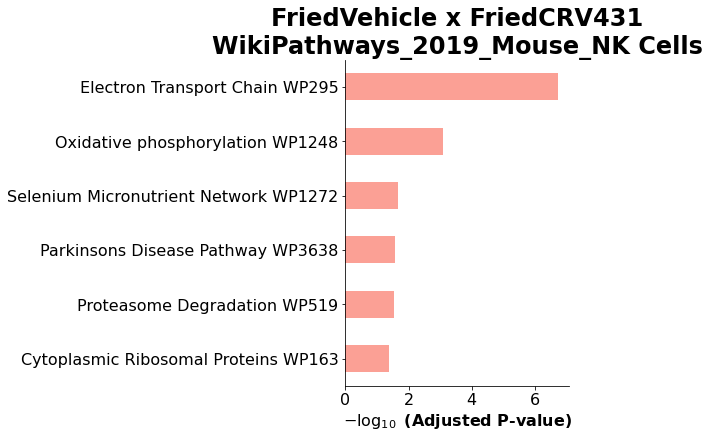

['B Cells' 'Basophils' 'CTLs' 'CV & Cap. Macs' 'Cholangiocytes' 'Ebf1++'
 'Emp1++' 'Endothelial Cells' 'Hepatocytes' 'ILC1s' 'Jchain++'
 'Kupffer Cells' 'LAMs' 'Mig. cDCs' 'Monocytes' 'NK Cells' 'Naive CD4+'
 'Naive CD8+' 'Neutrophils' 'Pat. Mono' 'Peri. Macs' 'Stellate Cells'
 'Stmn1++' 'TEM' 'TRegs' 'Trans. Mono' 'Y-Delta T Cells' 'cDC1s' 'cDC2s'
 'pDCs']
Naive CD4+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


8
8
No Significant Stuffs
2


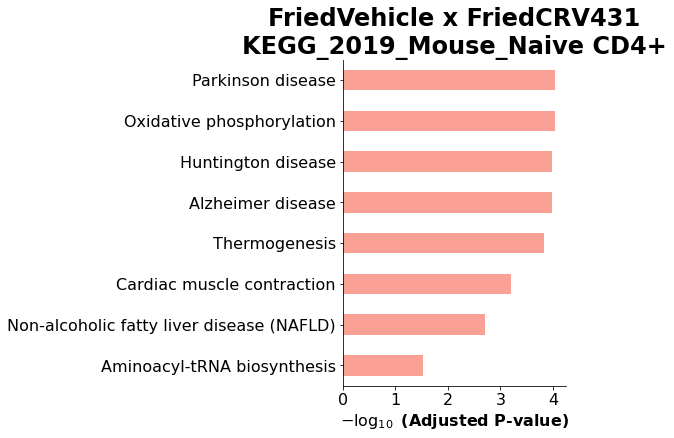

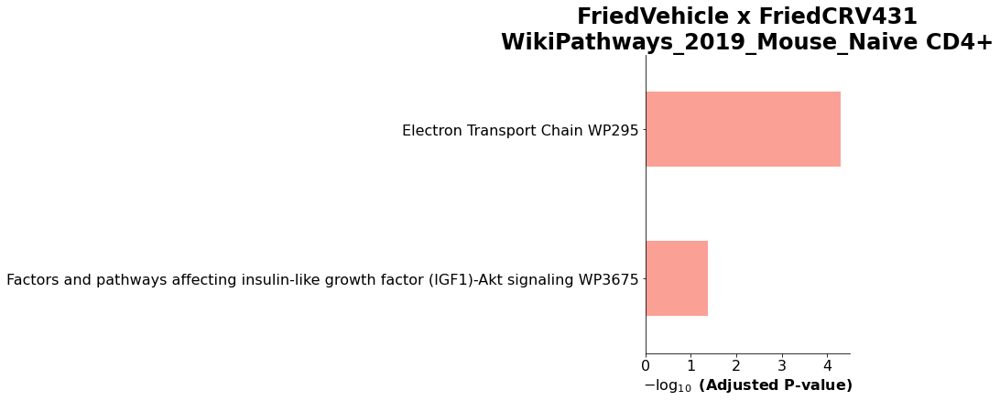

['B Cells' 'Basophils' 'CTLs' 'CV & Cap. Macs' 'Cholangiocytes' 'Ebf1++'
 'Emp1++' 'Endothelial Cells' 'Hepatocytes' 'ILC1s' 'Jchain++'
 'Kupffer Cells' 'LAMs' 'Mig. cDCs' 'Monocytes' 'NK Cells' 'Naive CD4+'
 'Naive CD8+' 'Neutrophils' 'Pat. Mono' 'Peri. Macs' 'Stellate Cells'
 'Stmn1++' 'TEM' 'TRegs' 'Trans. Mono' 'Y-Delta T Cells' 'cDC1s' 'cDC2s'
 'pDCs']
Naive CD8+


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


71
15
7
5


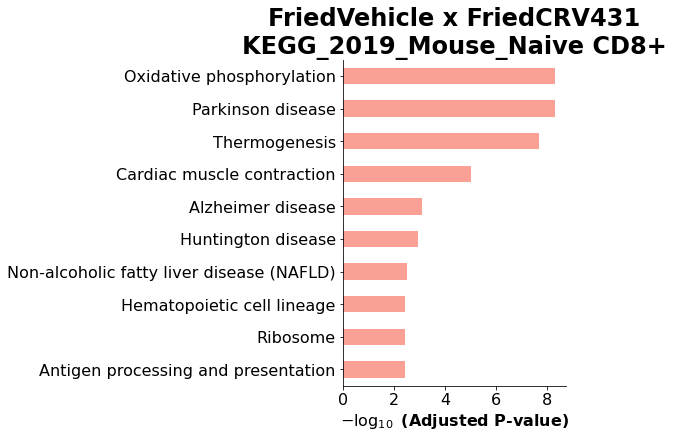

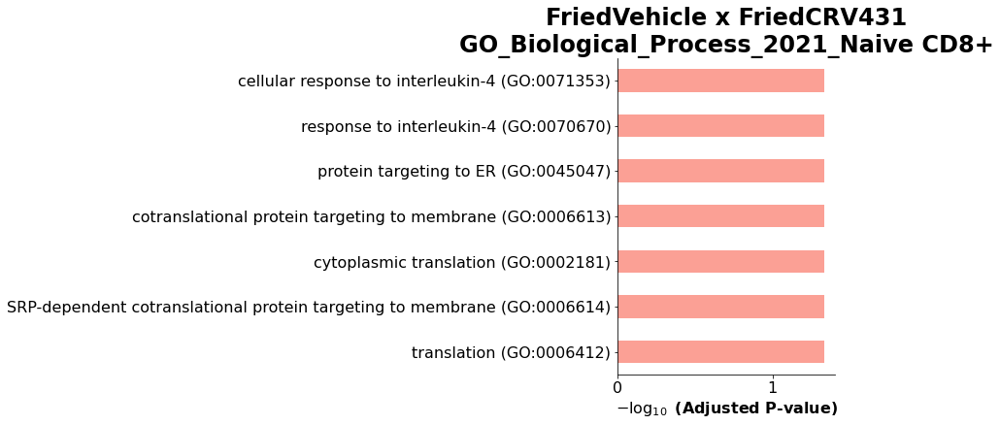

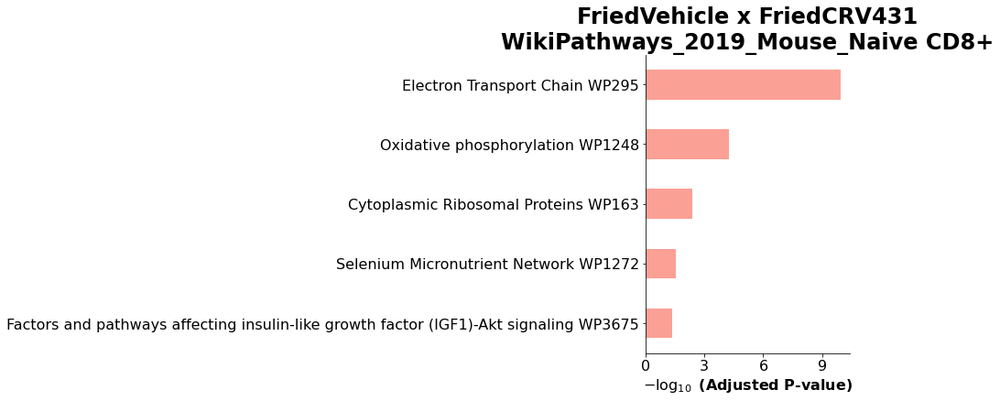

['B Cells' 'Basophils' 'CTLs' 'CV & Cap. Macs' 'Cholangiocytes' 'Ebf1++'
 'Emp1++' 'Endothelial Cells' 'Hepatocytes' 'ILC1s' 'Jchain++'
 'Kupffer Cells' 'LAMs' 'Mig. cDCs' 'Monocytes' 'NK Cells' 'Naive CD4+'
 'Naive CD8+' 'Neutrophils' 'Pat. Mono' 'Peri. Macs' 'Stellate Cells'
 'Stmn1++' 'TEM' 'TRegs' 'Trans. Mono' 'Y-Delta T Cells' 'cDC1s' 'cDC2s'
 'pDCs']
Neutrophils


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


42
9
36
5


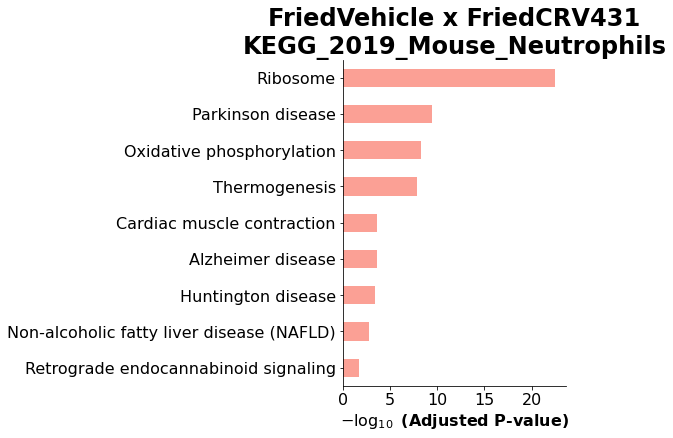

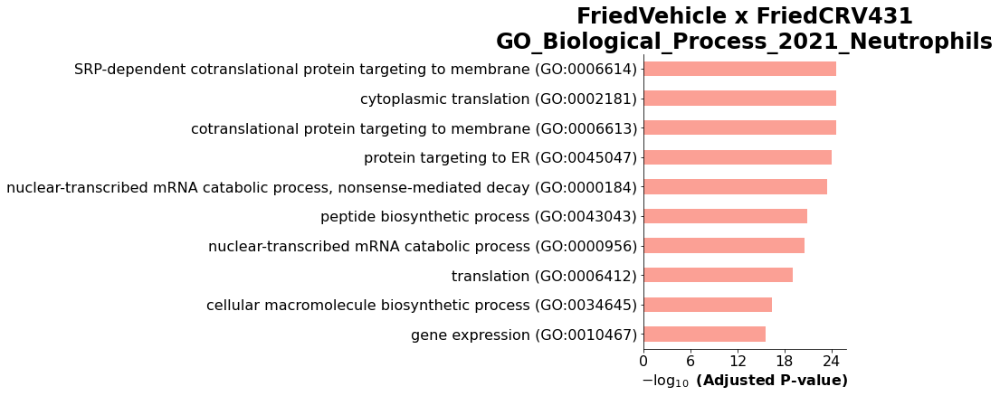

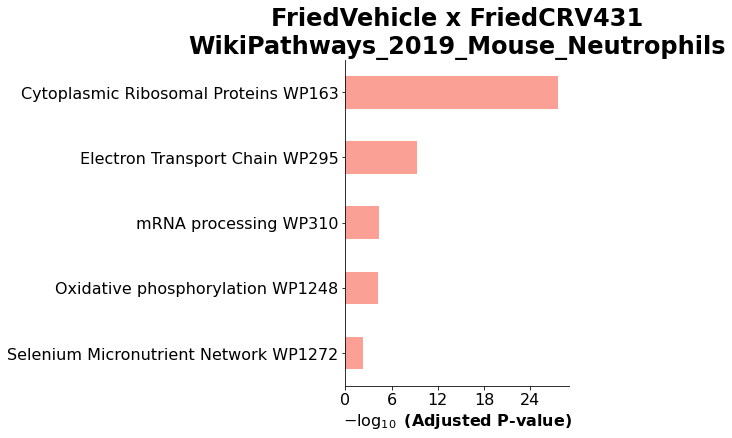

['B Cells' 'Basophils' 'CTLs' 'CV & Cap. Macs' 'Cholangiocytes' 'Ebf1++'
 'Emp1++' 'Endothelial Cells' 'Hepatocytes' 'ILC1s' 'Jchain++'
 'Kupffer Cells' 'LAMs' 'Mig. cDCs' 'Monocytes' 'NK Cells' 'Naive CD4+'
 'Naive CD8+' 'Neutrophils' 'Pat. Mono' 'Peri. Macs' 'Stellate Cells'
 'Stmn1++' 'TEM' 'TRegs' 'Trans. Mono' 'Y-Delta T Cells' 'cDC1s' 'cDC2s'
 'pDCs']
Pat. Mono


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


45
32
76
4


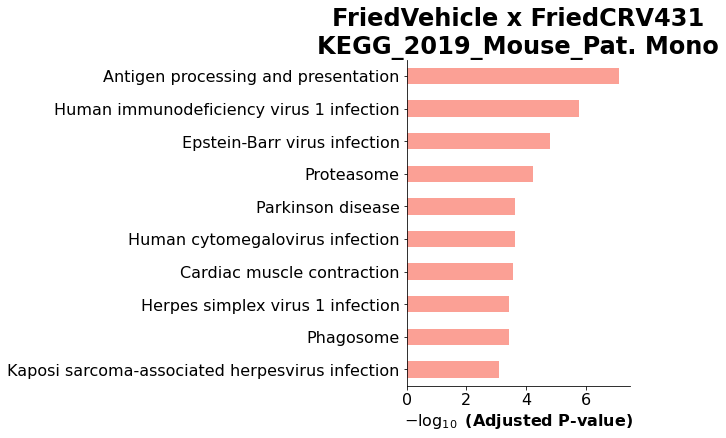

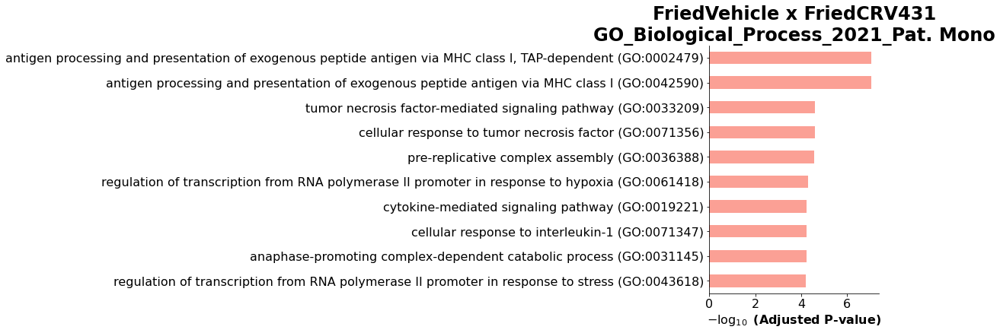

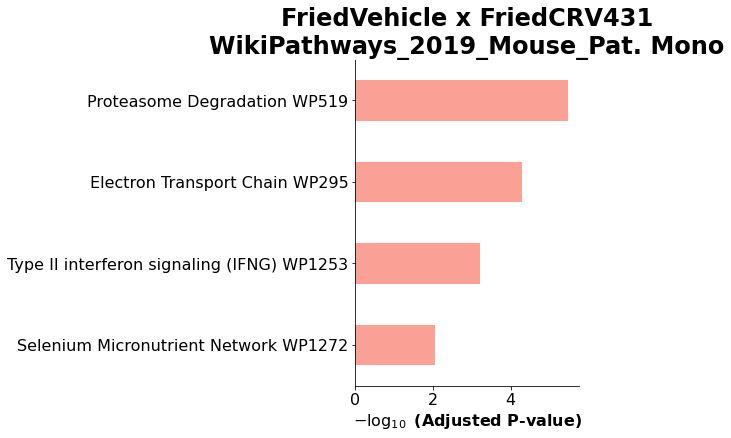

['B Cells' 'Basophils' 'CTLs' 'CV & Cap. Macs' 'Cholangiocytes' 'Ebf1++'
 'Emp1++' 'Endothelial Cells' 'Hepatocytes' 'ILC1s' 'Jchain++'
 'Kupffer Cells' 'LAMs' 'Mig. cDCs' 'Monocytes' 'NK Cells' 'Naive CD4+'
 'Naive CD8+' 'Neutrophils' 'Pat. Mono' 'Peri. Macs' 'Stellate Cells'
 'Stmn1++' 'TEM' 'TRegs' 'Trans. Mono' 'Y-Delta T Cells' 'cDC1s' 'cDC2s'
 'pDCs']
Peri. Macs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


106
31
134
12


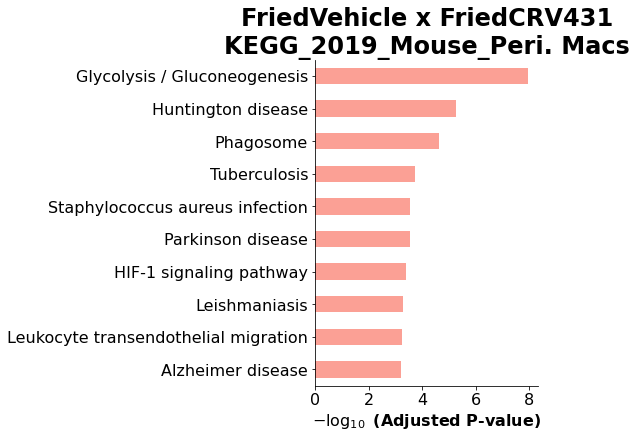

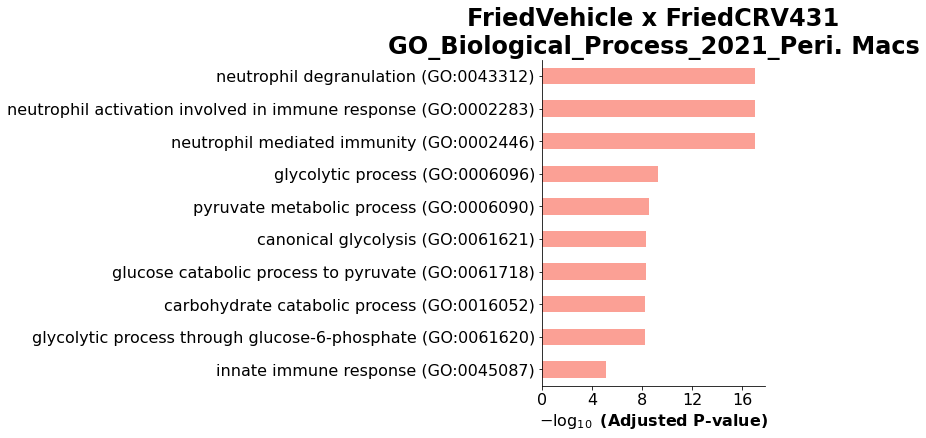

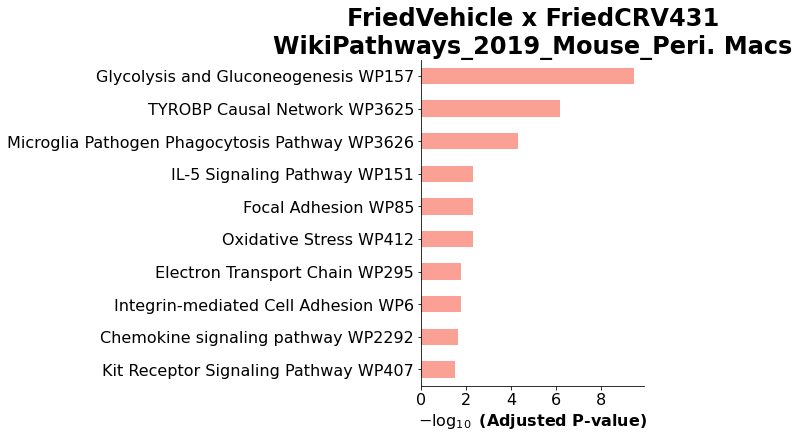

['B Cells' 'Basophils' 'CTLs' 'CV & Cap. Macs' 'Cholangiocytes' 'Ebf1++'
 'Emp1++' 'Endothelial Cells' 'Hepatocytes' 'ILC1s' 'Jchain++'
 'Kupffer Cells' 'LAMs' 'Mig. cDCs' 'Monocytes' 'NK Cells' 'Naive CD4+'
 'Naive CD8+' 'Neutrophils' 'Pat. Mono' 'Peri. Macs' 'Stellate Cells'
 'Stmn1++' 'TEM' 'TRegs' 'Trans. Mono' 'Y-Delta T Cells' 'cDC1s' 'cDC2s'
 'pDCs']
Stellate Cells
No sig. genes
['B Cells' 'Basophils' 'CTLs' 'CV & Cap. Macs' 'Cholangiocytes' 'Ebf1++'
 'Emp1++' 'Endothelial Cells' 'Hepatocytes' 'ILC1s' 'Jchain++'
 'Kupffer Cells' 'LAMs' 'Mig. cDCs' 'Monocytes' 'NK Cells' 'Naive CD4+'
 'Naive CD8+' 'Neutrophils' 'Pat. Mono' 'Peri. Macs' 'Stellate Cells'
 'Stmn1++' 'TEM' 'TRegs' 'Trans. Mono' 'Y-Delta T Cells' 'cDC1s' 'cDC2s'
 'pDCs']
Stmn1++


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


No sig. genes
['B Cells' 'Basophils' 'CTLs' 'CV & Cap. Macs' 'Cholangiocytes' 'Ebf1++'
 'Emp1++' 'Endothelial Cells' 'Hepatocytes' 'ILC1s' 'Jchain++'
 'Kupffer Cells' 'LAMs' 'Mig. cDCs' 'Monocytes' 'NK Cells' 'Naive CD4+'
 'Naive CD8+' 'Neutrophils' 'Pat. Mono' 'Peri. Macs' 'Stellate Cells'
 'Stmn1++' 'TEM' 'TRegs' 'Trans. Mono' 'Y-Delta T Cells' 'cDC1s' 'cDC2s'
 'pDCs']
TRegs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


5
9
77
4


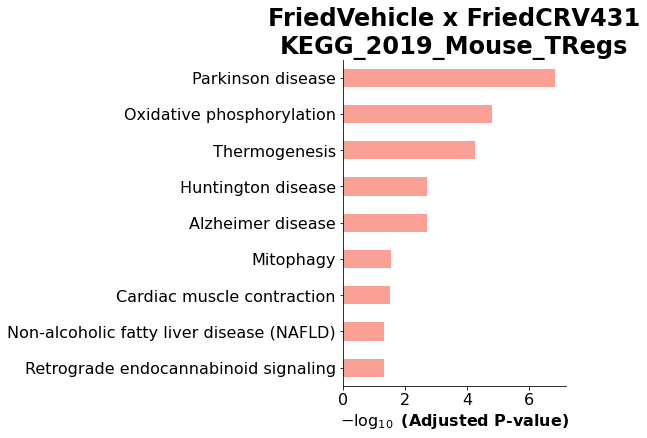

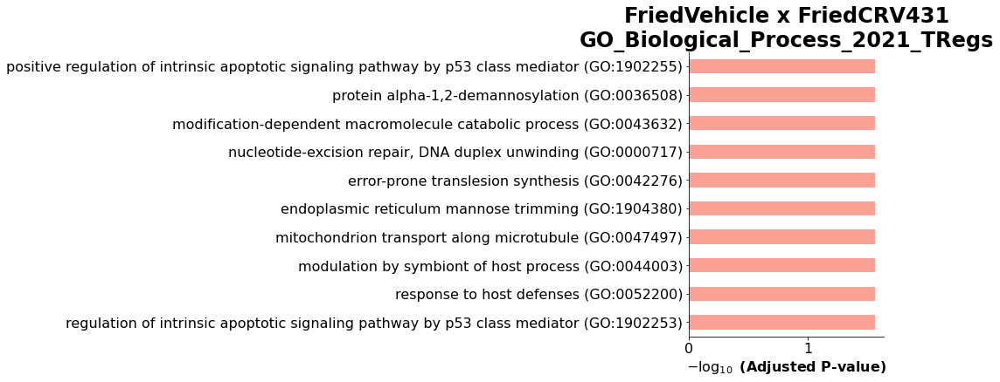

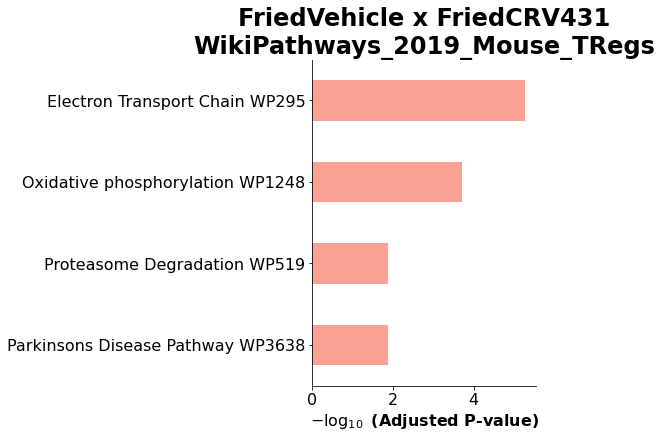

['B Cells' 'Basophils' 'CTLs' 'CV & Cap. Macs' 'Cholangiocytes' 'Ebf1++'
 'Emp1++' 'Endothelial Cells' 'Hepatocytes' 'ILC1s' 'Jchain++'
 'Kupffer Cells' 'LAMs' 'Mig. cDCs' 'Monocytes' 'NK Cells' 'Naive CD4+'
 'Naive CD8+' 'Neutrophils' 'Pat. Mono' 'Peri. Macs' 'Stellate Cells'
 'Stmn1++' 'TEM' 'TRegs' 'Trans. Mono' 'Y-Delta T Cells' 'cDC1s' 'cDC2s'
 'pDCs']
Trans. Mono


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


395
54
243
23


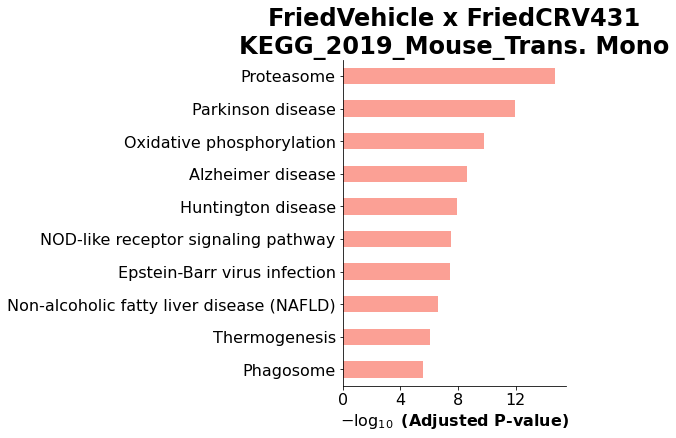

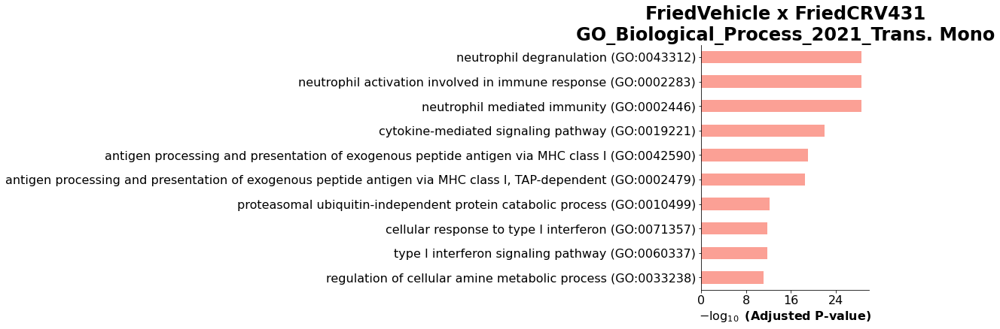

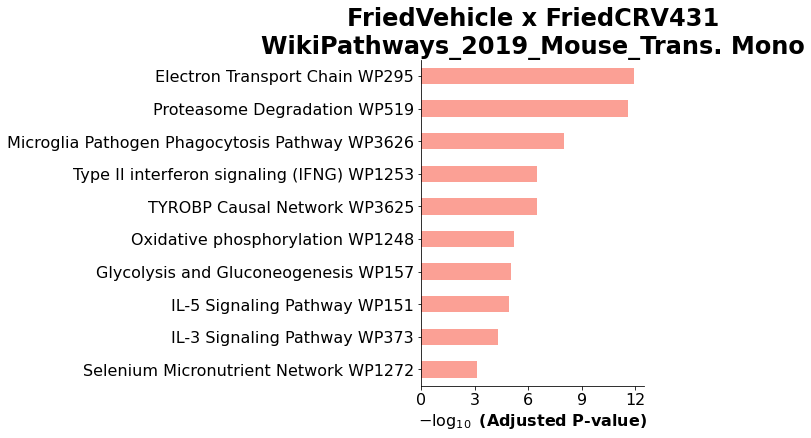

['B Cells' 'Basophils' 'CTLs' 'CV & Cap. Macs' 'Cholangiocytes' 'Ebf1++'
 'Emp1++' 'Endothelial Cells' 'Hepatocytes' 'ILC1s' 'Jchain++'
 'Kupffer Cells' 'LAMs' 'Mig. cDCs' 'Monocytes' 'NK Cells' 'Naive CD4+'
 'Naive CD8+' 'Neutrophils' 'Pat. Mono' 'Peri. Macs' 'Stellate Cells'
 'Stmn1++' 'TEM' 'TRegs' 'Trans. Mono' 'Y-Delta T Cells' 'cDC1s' 'cDC2s'
 'pDCs']
Y-Delta T Cells


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


No sig. genes
['B Cells' 'Basophils' 'CTLs' 'CV & Cap. Macs' 'Cholangiocytes' 'Ebf1++'
 'Emp1++' 'Endothelial Cells' 'Hepatocytes' 'ILC1s' 'Jchain++'
 'Kupffer Cells' 'LAMs' 'Mig. cDCs' 'Monocytes' 'NK Cells' 'Naive CD4+'
 'Naive CD8+' 'Neutrophils' 'Pat. Mono' 'Peri. Macs' 'Stellate Cells'
 'Stmn1++' 'TEM' 'TRegs' 'Trans. Mono' 'Y-Delta T Cells' 'cDC1s' 'cDC2s'
 'pDCs']
cDC1s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


4
7
No Significant Stuffs
2


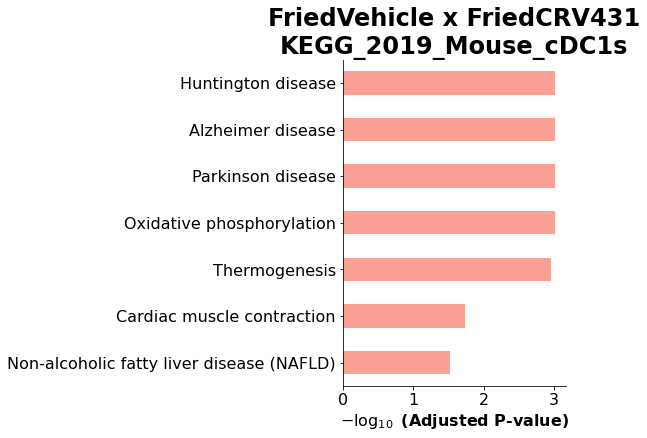

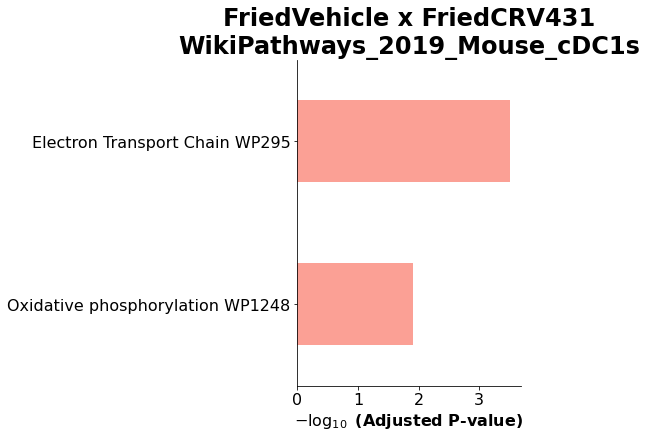

['B Cells' 'Basophils' 'CTLs' 'CV & Cap. Macs' 'Cholangiocytes' 'Ebf1++'
 'Emp1++' 'Endothelial Cells' 'Hepatocytes' 'ILC1s' 'Jchain++'
 'Kupffer Cells' 'LAMs' 'Mig. cDCs' 'Monocytes' 'NK Cells' 'Naive CD4+'
 'Naive CD8+' 'Neutrophils' 'Pat. Mono' 'Peri. Macs' 'Stellate Cells'
 'Stmn1++' 'TEM' 'TRegs' 'Trans. Mono' 'Y-Delta T Cells' 'cDC1s' 'cDC2s'
 'pDCs']
cDC2s


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


19
10
No Significant Stuffs
3


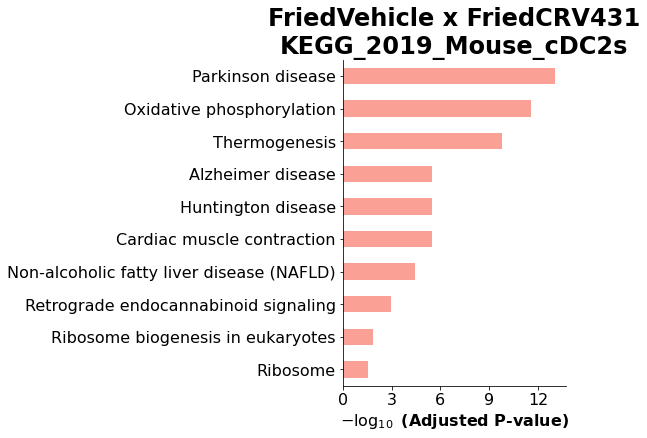

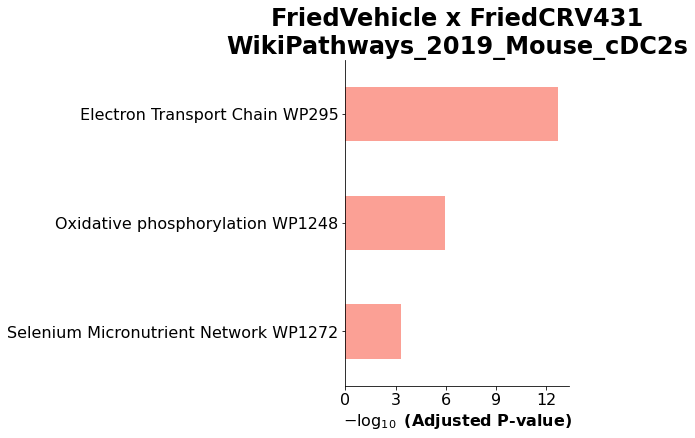

['B Cells' 'Basophils' 'CTLs' 'CV & Cap. Macs' 'Cholangiocytes' 'Ebf1++'
 'Emp1++' 'Endothelial Cells' 'Hepatocytes' 'ILC1s' 'Jchain++'
 'Kupffer Cells' 'LAMs' 'Mig. cDCs' 'Monocytes' 'NK Cells' 'Naive CD4+'
 'Naive CD8+' 'Neutrophils' 'Pat. Mono' 'Peri. Macs' 'Stellate Cells'
 'Stmn1++' 'TEM' 'TRegs' 'Trans. Mono' 'Y-Delta T Cells' 'cDC1s' 'cDC2s'
 'pDCs']
pDCs


/Users/JackBrons/miniconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


10
9
No Significant Stuffs
5


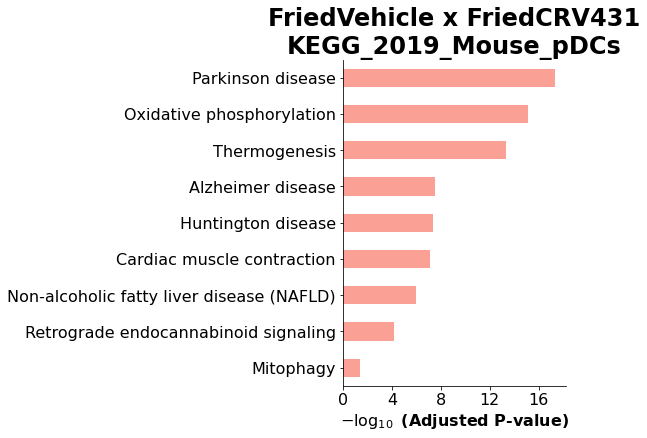

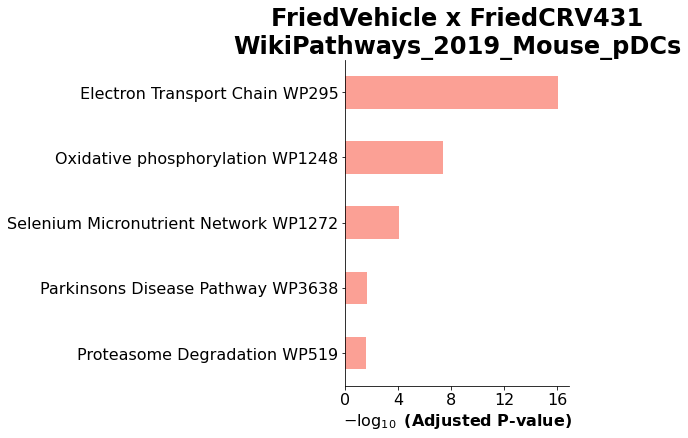

OSError: Cannot save file into a non-existent directory: 'None'

In [121]:
#gene_set_names = gseapy.get_library_name(organism='Mouse')
#print(gene_set_names)

#treatments1 = ['NonfatVehicle','FriedVehicle', 'FriedVehicle', 'FriedVehicle', 'FriedLANI']
#treatments2 = ['FriedVehicle', 'FriedCRV431','FriedLANI','FriedCRVLAN', 'FriedCRV431']
treatments1=['FriedVehicle']
treatments2=['FriedCRV431']
depth='fine'
analysis = None
#analysis = 'GO_Biological_Process_2021' #['KEGG_2019_Mouse', 'GO_Biological_Process_2021', 'WikiPathways_2019_Mouse']
savePics=False

t0 = time.time()
for treat1,treat2 in zip(treatments1, treatments2):
    df = []
    comparison = f"{treat1} x {treat2}"
    print('\n'+comparison)
    cadata = process.catAdata(Data, [treat1, treat2], normReads=False, combat=False)
    cadata = cadata.raw.to_adata()
    sc.pp.normalize_total(cadata)
    sc.pp.log1p(cadata)
    print(np.unique(cadata[cadata.obs['batch']==treat2].obs[f'{depth}Clusters']))
    for cellType in np.unique(cadata[cadata.obs['batch']==treat2].obs[f'{depth}Clusters']):
        print(np.unique(cadata[cadata.obs['batch']==treat1].obs[f'{depth}Clusters']))
        if cellType in np.unique(cadata[cadata.obs['batch']==treat1].obs[f'{depth}Clusters']):
            print(f"{cellType}")
            adata = cadata[cadata.obs[f'{depth}Clusters']==cellType]
            sc.tl.rank_genes_groups(adata, 'batch', groups=[treat2], reference=treat1, use_raw=False, method='wilcoxon', max_iter=2000, pts=False, key_added = "wilcoxon")
            glist = sc.get.rank_genes_groups_df(adata, group=treat2, 
                                                key='wilcoxon', log2fc_min=0.25, 
                                                pval_cutoff=0.01)['names'].squeeze()
            #print(glist)
            if type(glist)!=str:
                glist = glist.str.strip().tolist()
            else:
                  glist=[glist]
            if len(glist)>0:
                print(len(glist))
                result = process.enrich(glist, analyses=analysis, treatment=comparison, title_suffix='_'+cellType, return_df=True)[0]
                if savePics:
                    plt.savefig(f"images/{comparison}_{cellType}_{analysis}.png", bbox_inches='tight')
                plt.show()
                result = result[result['Adjusted P-value']<0.1]
                result['Cell Type'] = [cellType]*result.shape[0]
                result = result[['Gene_set','Cell Type', 'Term','Overlap','Adjusted P-value','Genes']]
                
                df.append(result)
                
                #enr_res.results = enr_res.results[['Gene_set','Term','Overlap','Adjusted P-value','Genes']]
                #enr_res.results=enr_res.results[enr_res.results['Adjusted P-value']<0.1]
            else:
                print("No sig. genes")
    df= pd.concat(df, ignore_index=True)
    df.to_csv(f"{analysis}/{comparison}.csv")

print("Finished")
print(f"{time.time()-t0}s")

           Gene_set                                         Term Overlap  \
0   KEGG_2019_Mouse  Protein processing in endoplasmic reticulum   5/163   
1   KEGG_2019_Mouse          Antigen processing and presentation    4/90   
2   KEGG_2019_Mouse                            Viral myocarditis    3/87   
3   KEGG_2019_Mouse                   Estrogen signaling pathway   3/134   
4   KEGG_2019_Mouse               Cell adhesion molecules (CAMs)   3/170   
..              ...                                          ...     ...   
62  KEGG_2019_Mouse             Regulation of actin cytoskeleton   1/217   
63  KEGG_2019_Mouse     Human immunodeficiency virus 1 infection   1/238   
64  KEGG_2019_Mouse      Human T-cell leukemia virus 1 infection   1/245   
65  KEGG_2019_Mouse                       MAPK signaling pathway   1/294   
66  KEGG_2019_Mouse               Human papillomavirus infection   1/360   

     P-value  Adjusted P-value  Old P-value  Old Adjusted P-value  Odds Ratio  \
0   0.

<AxesSubplot: title={'center': 'WikiPathways_2019_Mouse'}, xlabel='$- \\log_{10}$ (Adjusted P-value)'>

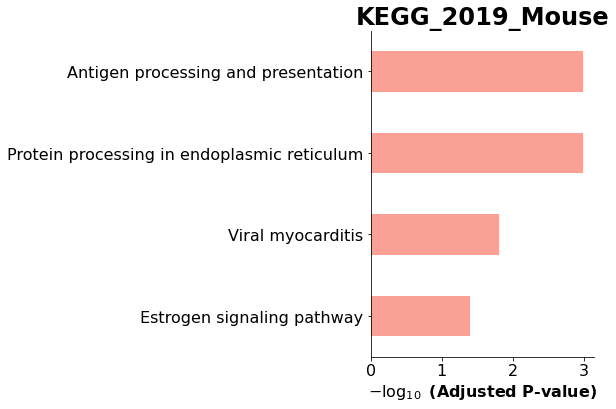

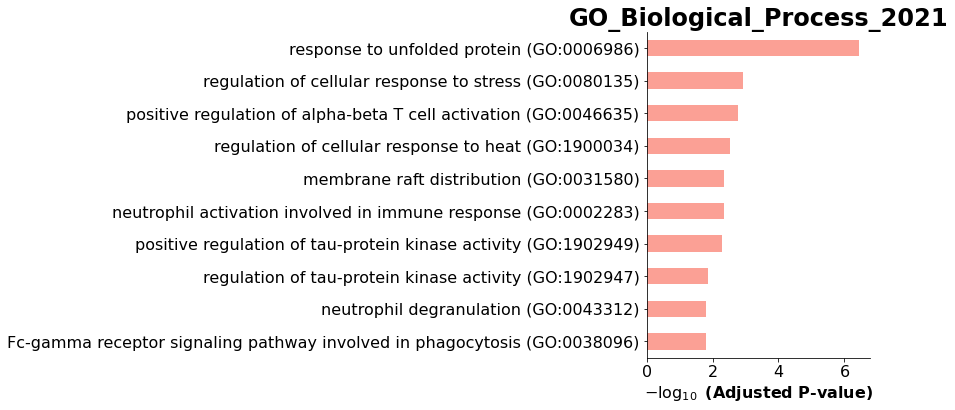

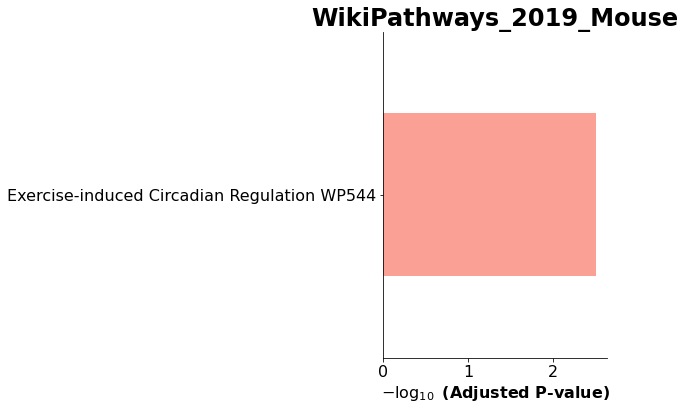

In [68]:
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Mouse',
                     gene_sets='KEGG_2019_Mouse',
                     cutoff = 0.5)
print(enr_res.res2d)
gseapy.barplot(enr_res.res2d,title='KEGG_2019_Mouse')
enr_res.results = enr_res.results[['Gene_set','Term','Overlap','Adjusted P-value','Genes']]
enr_res.results=enr_res.results[enr_res.results['Adjusted P-value']<0.1]
print(enr_res.results)

enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Mouse',
                     gene_sets='GO_Biological_Process_2021',
                     cutoff = 0.5)
gseapy.barplot(enr_res.res2d,title='GO_Biological_Process_2021')

enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Mouse',
                     gene_sets='WikiPathways_2019_Mouse',
                     cutoff = 0.5)
gseapy.barplot(enr_res.res2d,title='WikiPathways_2019_Mouse')

In [40]:
print(enr_res.results[['Gene_set','Term','Overlap','Adjusted P-value','Genes']])

                   Gene_set                                 Term Overlap  \
0   WikiPathways_2019_Mouse       Electron Transport Chain WP295   9/103   
1   WikiPathways_2019_Mouse         TYROBP Causal Network WP3625    7/58   
2   WikiPathways_2019_Mouse         MAPK signaling pathway WP493  10/159   
3   WikiPathways_2019_Mouse                  Focal Adhesion WP85  10/185   
4   WikiPathways_2019_Mouse   Chemokine signaling pathway WP2292  10/190   
..                      ...                                  ...     ...   
83  WikiPathways_2019_Mouse      ESC Pluripotency Pathways WP339   1/118   
84  WikiPathways_2019_Mouse                mRNA processing WP310   3/457   
85  WikiPathways_2019_Mouse                    GPCRs, Other WP41   1/155   
86  WikiPathways_2019_Mouse             Purine metabolism WP2185   1/171   
87  WikiPathways_2019_Mouse  GPCRs, Class A Rhodopsin-like WP189   1/228   

    Adjusted P-value                                              Genes  
0           0